In [1]:
# Dependencies and Setup
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import scipy.stats as st
import requests
import time
from scipy.stats import linregress
import hvplot.pandas
from api_keys import geoapify_key
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from api_keys import geoapify_key


In [2]:
# The path to your CSV files
file_paths = ["resources/2015.csv", "resources/2016.csv", "resources/2017.csv", "resources/2018.csv", "resources/2019.csv", "resources/2020.csv"]

# Loop through the file paths for 2015-2020 and process each file separately
for file_path in file_paths:
    year = os.path.splitext(os.path.basename(file_path))[0]  # Extract the year from the file name
    df = pd.read_csv(file_path, thousands=',', decimal='.')

    # Determine the column name for the "Country" column
    country_column = None
    if 'Country' in df.columns:
        country_column = 'Country'
    elif 'Country or region' in df.columns:
        country_column = 'Country or region'

    if country_column:
        # Define a dictionary to map column names to the desired names
        df.rename(columns={
            "Country or region": "Country",
            "Country name": "Country",
            "Happiness.Score": "Happiness Score",
            "Ladder score": "Happiness Score",
            "Score": "Happiness Score",
            "Economy..GDP.per.Capita.": "GDP per Capita",
            "Economy (GDP per Capita)": "GDP per Capita",
            "Logged GDP per capita": "GDP per Capita",
            "GDP per capita": "GDP per Capita",
            "Family": "Social Support",
            "Social support": "Social Support",
            "Explained by: GDP per capita": "GDP per Capita",
            "Health..Life.Expectancy.": "Life Expectancy/Health",
            "Health (Life Expectancy)": "Life Expectancy/Health",
            "Healthy life expectancy": "Life Expectancy/Health",
            "Freedom to make life choices": "Freedom",
            "Trust..Government.Corruption.": "Trust (government corruption)",
            "Trust (Government Corruption)": "Trust (government corruption)",
            "Perceptions of corruption": "Trust (government corruption)",
            "Explained by: Generosity": "Generosity"
        }, inplace=True)

        # Select the desired columns in the specified order
        desired_columns = ["Country", "Happiness Score", "GDP per Capita", 
                           "Social Support", "Life Expectancy/Health", "Freedom", "Trust (government corruption)", 
                           "Generosity"]

        df = df[desired_columns]

        # Save the processed DataFrame to a separate CSV file for the current year
        output_file = f"resources/data_{year}_.csv"
        df.to_csv(output_file, index=False)
    

In [3]:
#Read our datas from csv files
data2015 = pd.read_csv('resources/data_2015_.csv') 
data2015.head()

,Country,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
0,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678
1,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.14145,0.43630
2,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.48357,0.34139
3,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.36503,0.34699
4,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.32957,0.45811


In [4]:
data2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 158 entries, 0 to 157
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Country                        158 non-null    object 
 1   Happiness Score                158 non-null    float64
 2   GDP per Capita                 158 non-null    float64
 3   Social Support                 158 non-null    float64
 4   Life Expectancy/Health         158 non-null    float64
 5   Freedom                        158 non-null    float64
 6   Trust (government corruption)  158 non-null    float64
 7   Generosity                     158 non-null    float64
dtypes: float64(7), object(1)
memory usage: 10.0+ KB


In [5]:
data2015.columns

Index(['Country', 'Happiness Score', 'GDP per Capita', 'Social Support',
       'Life Expectancy/Health', 'Freedom', 'Trust (government corruption)',
       'Generosity'],
      dtype='object')

In [6]:
#That means we've got 158 rows and 13 columns
data2015.shape 

(158, 8)

In [7]:
#give us to correloation map
data2015.corr() 

,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
Happiness Score,1.000000,0.780966,0.740605,0.724200,0.568211,0.395199,0.180319
GDP per Capita,0.780966,1.000000,0.645299,0.816478,0.370300,0.307885,-0.010465
Social Support,0.740605,0.645299,1.000000,0.531104,0.441518,0.205605,0.087513
Life Expectancy/Health,0.724200,0.816478,0.531104,1.000000,0.360477,0.248335,0.108335
Freedom,0.568211,0.370300,0.441518,0.360477,1.000000,0.493524,0.373916
Trust (government corruption),0.395199,0.307885,0.205605,0.248335,0.493524,1.000000,0.276123
Generosity,0.180319,-0.010465,0.087513,0.108335,0.373916,0.276123,1.000000


In [8]:
#Read our datas from csv files
data2016 = pd.read_csv('resources/data_2016_.csv') 
data2016.head()

,Country,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
0,Denmark,7.526,1.44178,1.16374,0.79504,0.57941,0.44453,0.36171
1,Switzerland,7.509,1.52733,1.14524,0.86303,0.58557,0.41203,0.28083
2,Iceland,7.501,1.42666,1.18326,0.86733,0.56624,0.14975,0.47678
3,Norway,7.498,1.57744,1.12690,0.79579,0.59609,0.35776,0.37895
4,Finland,7.413,1.40598,1.13464,0.81091,0.57104,0.41004,0.25492


In [9]:
data2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 157 entries, 0 to 156
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Country                        157 non-null    object 
 1   Happiness Score                157 non-null    float64
 2   GDP per Capita                 157 non-null    float64
 3   Social Support                 157 non-null    float64
 4   Life Expectancy/Health         157 non-null    float64
 5   Freedom                        157 non-null    float64
 6   Trust (government corruption)  157 non-null    float64
 7   Generosity                     157 non-null    float64
dtypes: float64(7), object(1)
memory usage: 9.9+ KB


In [10]:
data2016.columns

Index(['Country', 'Happiness Score', 'GDP per Capita', 'Social Support',
       'Life Expectancy/Health', 'Freedom', 'Trust (government corruption)',
       'Generosity'],
      dtype='object')

In [11]:
#That means we've got 158 rows and 13 columns
data2016.shape 

(157, 8)

In [12]:
#give us to correloation map
data2016.corr() 

,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
Happiness Score,1.000000,0.790322,0.739252,0.765384,0.566827,0.402032,0.156848
GDP per Capita,0.790322,1.000000,0.669540,0.837067,0.362283,0.294185,-0.025531
Social Support,0.739252,0.669540,1.000000,0.588377,0.450208,0.213561,0.089629
Life Expectancy/Health,0.765384,0.837067,0.588377,1.000000,0.341199,0.249583,0.075987
Freedom,0.566827,0.362283,0.450208,0.341199,1.000000,0.502054,0.361751
Trust (government corruption),0.402032,0.294185,0.213561,0.249583,0.502054,1.000000,0.305930
Generosity,0.156848,-0.025531,0.089629,0.075987,0.361751,0.305930,1.000000


In [13]:
#Read our datas from csv files
data2017 = pd.read_csv('resources/data_2017_.csv') 
data2017.head()

,Country,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
0,Norway,7.537,1.616463,1.533524,0.796667,0.635423,0.315964,0.362012
1,Denmark,7.522,1.482383,1.551122,0.792566,0.626007,0.400770,0.355280
2,Iceland,7.504,1.480633,1.610574,0.833552,0.627163,0.153527,0.475540
3,Switzerland,7.494,1.564980,1.516912,0.858131,0.620071,0.367007,0.290549
4,Finland,7.469,1.443572,1.540247,0.809158,0.617951,0.382612,0.245483


In [14]:
data2017.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155 entries, 0 to 154
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Country                        155 non-null    object 
 1   Happiness Score                155 non-null    float64
 2   GDP per Capita                 155 non-null    float64
 3   Social Support                 155 non-null    float64
 4   Life Expectancy/Health         155 non-null    float64
 5   Freedom                        155 non-null    float64
 6   Trust (government corruption)  155 non-null    float64
 7   Generosity                     155 non-null    float64
dtypes: float64(7), object(1)
memory usage: 9.8+ KB


In [15]:
data2017.columns

Index(['Country', 'Happiness Score', 'GDP per Capita', 'Social Support',
       'Life Expectancy/Health', 'Freedom', 'Trust (government corruption)',
       'Generosity'],
      dtype='object')

In [16]:
#That means we've got 158 rows and 13 columns
data2017.shape 

(155, 8)

In [17]:
#give us to correloation map
data2017.corr() 

,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
Happiness Score,1.000000,0.812469,0.752737,0.781951,0.570137,0.429080,0.155256
GDP per Capita,0.812469,1.000000,0.688296,0.843077,0.369873,0.350944,-0.019011
Social Support,0.752737,0.688296,1.000000,0.612080,0.424966,0.231841,0.051693
Life Expectancy/Health,0.781951,0.843077,0.612080,1.000000,0.349827,0.279752,0.063191
Freedom,0.570137,0.369873,0.424966,0.349827,1.000000,0.499183,0.316083
Trust (government corruption),0.429080,0.350944,0.231841,0.279752,0.499183,1.000000,0.294159
Generosity,0.155256,-0.019011,0.051693,0.063191,0.316083,0.294159,1.000000


In [18]:
#Read our datas from csv files
data2018 = pd.read_csv('resources/data_2018_.csv') 
data2018.head()

,Country,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
0,Finland,7.632,1.305,1.592,0.874,0.681,0.393,0.202
1,Norway,7.594,1.456,1.582,0.861,0.686,0.340,0.286
2,Denmark,7.555,1.351,1.590,0.868,0.683,0.408,0.284
3,Iceland,7.495,1.343,1.644,0.914,0.677,0.138,0.353
4,Switzerland,7.487,1.420,1.549,0.927,0.660,0.357,0.256


In [19]:
data2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 156 entries, 0 to 155
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Country                        156 non-null    object 
 1   Happiness Score                156 non-null    float64
 2   GDP per Capita                 156 non-null    float64
 3   Social Support                 156 non-null    float64
 4   Life Expectancy/Health         156 non-null    float64
 5   Freedom                        156 non-null    float64
 6   Trust (government corruption)  155 non-null    float64
 7   Generosity                     156 non-null    float64
dtypes: float64(7), object(1)
memory usage: 9.9+ KB


In [20]:
data2018.columns

Index(['Country', 'Happiness Score', 'GDP per Capita', 'Social Support',
       'Life Expectancy/Health', 'Freedom', 'Trust (government corruption)',
       'Generosity'],
      dtype='object')

In [21]:
#That means we've got 158 rows and 13 columns
data2018.shape 

(156, 8)

In [22]:
#give us to correloation map
data2018.corr() 

,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
Happiness Score,1.000000,0.802124,0.745760,0.775814,0.544280,0.405292,0.135825
GDP per Capita,0.802124,1.000000,0.672080,0.844273,0.332275,0.319582,-0.011241
Social Support,0.745760,0.672080,1.000000,0.667288,0.411087,0.218364,0.018226
Life Expectancy/Health,0.775814,0.844273,0.667288,1.000000,0.355475,0.315569,0.020751
Freedom,0.544280,0.332275,0.411087,0.355475,1.000000,0.462446,0.297988
Trust (government corruption),0.405292,0.319582,0.218364,0.315569,0.462446,1.000000,0.362249
Generosity,0.135825,-0.011241,0.018226,0.020751,0.297988,0.362249,1.000000


In [23]:
#Read our datas from csv files
data2019 = pd.read_csv('resources/data_2019_.csv') 
data2019.head()

,Country,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
0,Finland,7.769,1.340,1.587,0.986,0.596,0.393,0.153
1,Denmark,7.600,1.383,1.573,0.996,0.592,0.410,0.252
2,Norway,7.554,1.488,1.582,1.028,0.603,0.341,0.271
3,Iceland,7.494,1.380,1.624,1.026,0.591,0.118,0.354
4,Netherlands,7.488,1.396,1.522,0.999,0.557,0.298,0.322


In [24]:
data2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 156 entries, 0 to 155
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Country                        156 non-null    object 
 1   Happiness Score                156 non-null    float64
 2   GDP per Capita                 156 non-null    float64
 3   Social Support                 156 non-null    float64
 4   Life Expectancy/Health         156 non-null    float64
 5   Freedom                        156 non-null    float64
 6   Trust (government corruption)  156 non-null    float64
 7   Generosity                     156 non-null    float64
dtypes: float64(7), object(1)
memory usage: 9.9+ KB


In [25]:
data2019.columns

Index(['Country', 'Happiness Score', 'GDP per Capita', 'Social Support',
       'Life Expectancy/Health', 'Freedom', 'Trust (government corruption)',
       'Generosity'],
      dtype='object')

In [26]:
#That means we've got 158 rows and 13 columns
data2019.shape 

(156, 8)

In [27]:
#give us to correloation map
data2019.corr() 

,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
Happiness Score,1.000000,0.793883,0.777058,0.779883,0.566742,0.385613,0.075824
GDP per Capita,0.793883,1.000000,0.754906,0.835462,0.379079,0.298920,-0.079662
Social Support,0.777058,0.754906,1.000000,0.719009,0.447333,0.181899,-0.048126
Life Expectancy/Health,0.779883,0.835462,0.719009,1.000000,0.390395,0.295283,-0.029511
Freedom,0.566742,0.379079,0.447333,0.390395,1.000000,0.438843,0.269742
Trust (government corruption),0.385613,0.298920,0.181899,0.295283,0.438843,1.000000,0.326538
Generosity,0.075824,-0.079662,-0.048126,-0.029511,0.269742,0.326538,1.000000


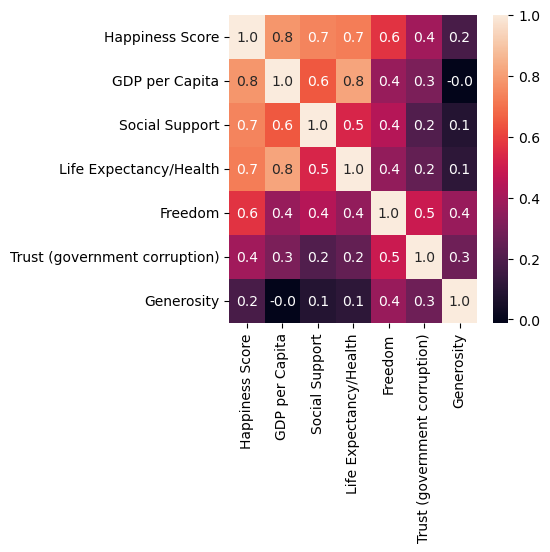

In [28]:
#this give us a figure of correlation map
f,ax = plt.subplots(figsize=(4, 4))
sns.heatmap(data2015.corr(), annot=True,fmt='.1f',ax=ax) 
#dismiss an information column
plt.show() 

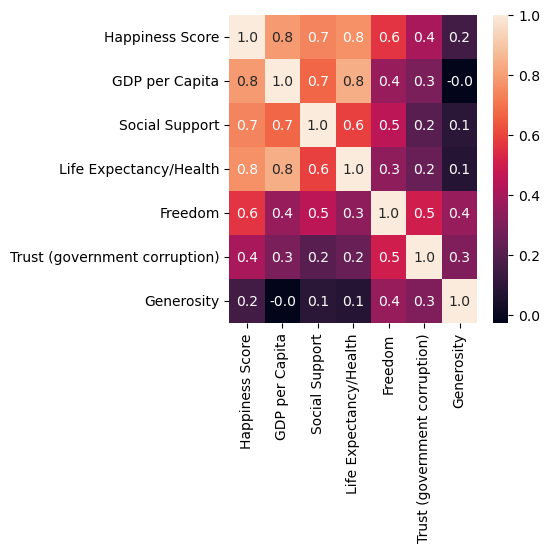

In [29]:
#this give us a figure of correlation map
f,ax = plt.subplots(figsize=(4, 4))
sns.heatmap(data2016.corr(), annot=True,fmt='.1f',ax=ax) 
#dismiss an information column
plt.show() 

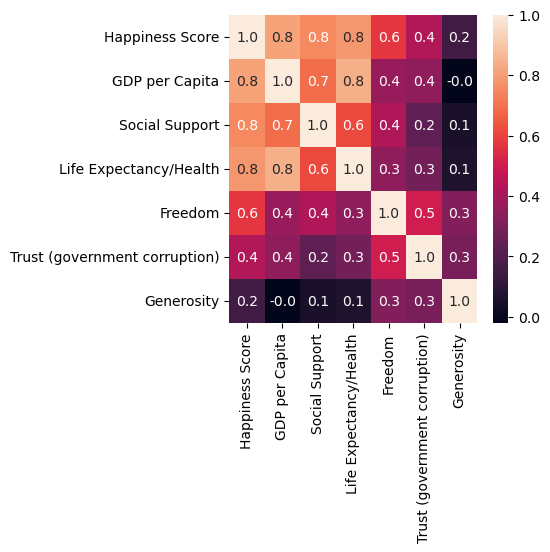

In [30]:
#this give us a figure of correlation map
f,ax = plt.subplots(figsize=(4, 4))
sns.heatmap(data2017.corr(), annot=True,fmt='.1f',ax=ax) 
#dismiss an information column
plt.show() 

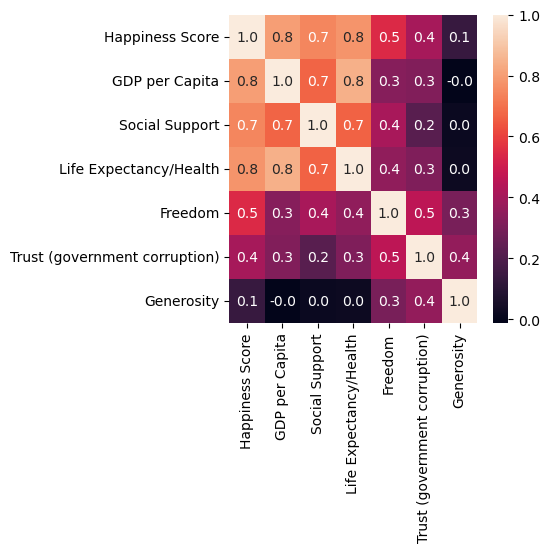

In [31]:
#this give us a figure of correlation map
f,ax = plt.subplots(figsize=(4, 4))
sns.heatmap(data2018.corr(), annot=True,fmt='.1f',ax=ax) 
#dismiss an information column
plt.show() 

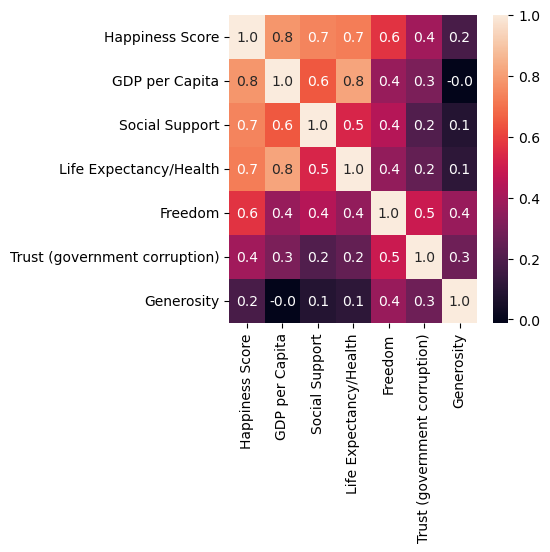

In [32]:
#this give us a figure of correlation map
f,ax = plt.subplots(figsize=(4, 4))
sns.heatmap(data2015.corr(), annot=True,fmt='.1f',ax=ax) 
#dismiss an information column
plt.show() 

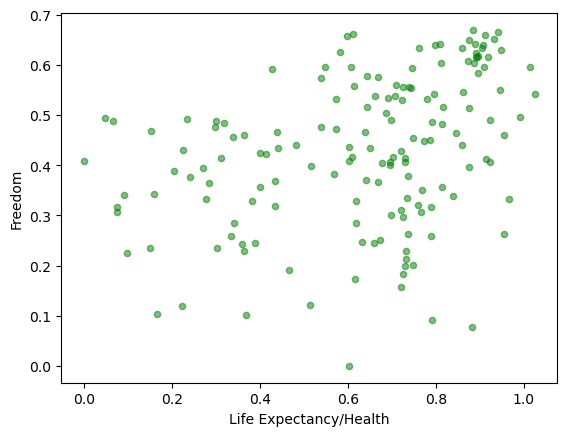

In [33]:
data2015.plot(kind='scatter',x='Life Expectancy/Health',y='Freedom',alpha=0.5,color='green')
plt.xlabel = 'Life Expectancy/Health'
plt.ylabel = 'Freedom'
plt.show()

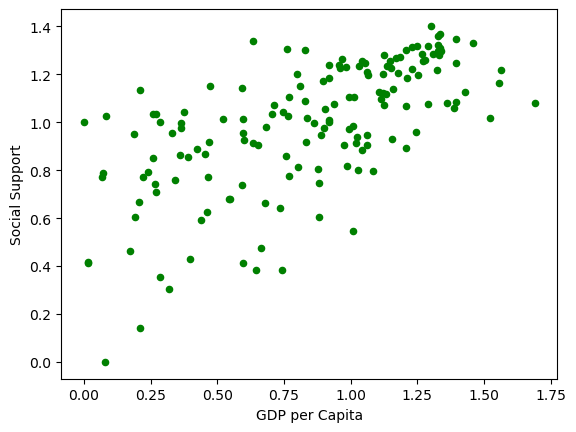

In [34]:
data2015.plot(kind='scatter',x='GDP per Capita',y='Social Support',alpha=1,color='green')
plt.xlabel = 'GDP per Capita'
plt.ylabel = 'Social Support'
plt.show()

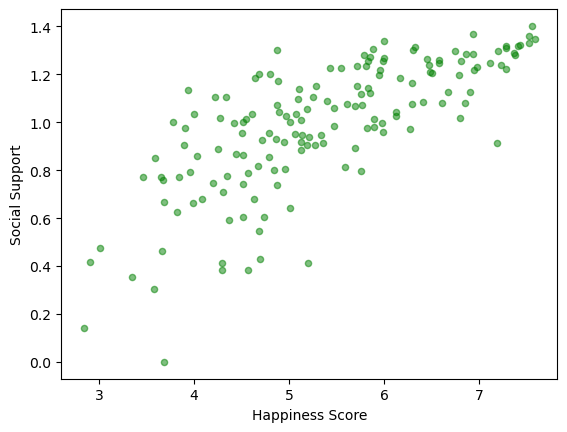

In [35]:
data2015.plot(kind='scatter',x='Happiness Score',y='Social Support',alpha=0.5,color='green')
plt.xlabel = 'Happiness Score'
plt.ylabel = 'Social Support'
plt.show()

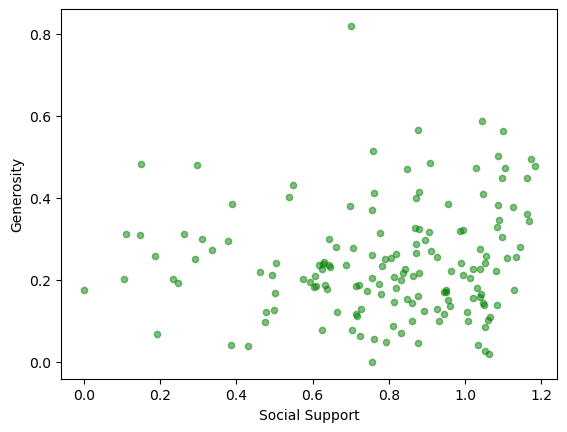

In [36]:
data2016.plot(kind='scatter',x='Social Support',y='Generosity',alpha=0.5,color='green')
plt.xlabel = 'Social Support'
plt.ylabel = 'Generosity'
plt.show()

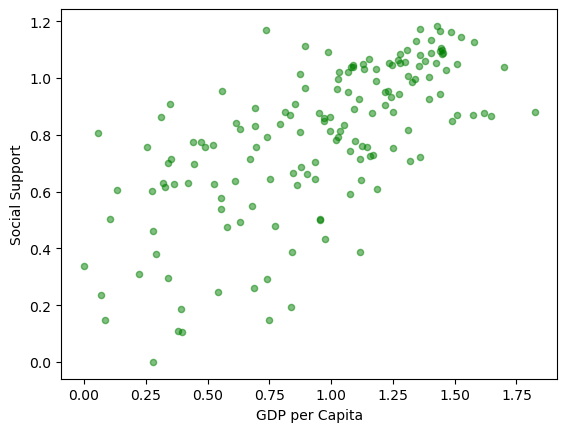

In [37]:
data2016.plot(kind='scatter',x='GDP per Capita',y='Social Support',alpha=.5,color='green')
plt.xlabel = 'GDP per Capita'
plt.ylabel = 'Social Support'
plt.show()

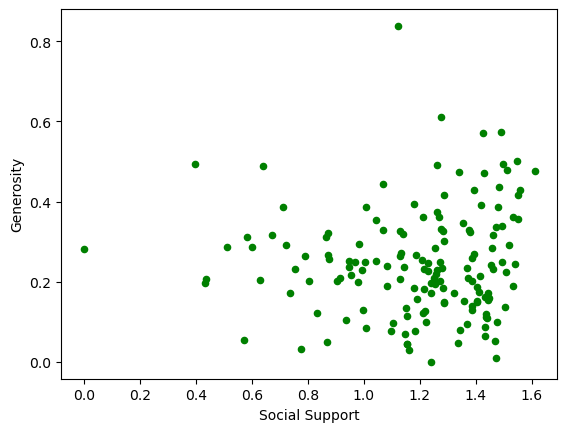

In [38]:
data2017.plot(kind='scatter',x='Social Support',y='Generosity',alpha=1,color='green')
plt.xlabel = 'Social Support'
plt.ylabel = 'Generosity'
plt.show()

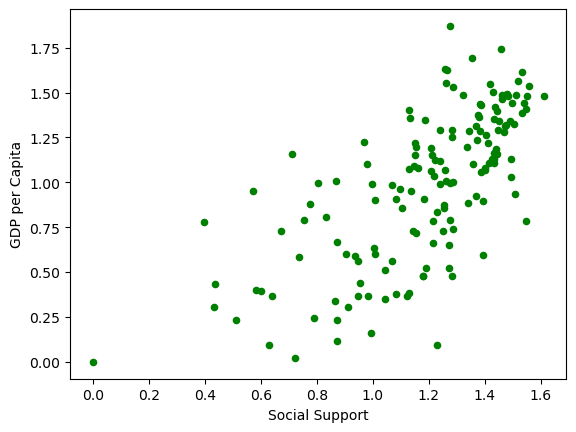

In [39]:
data2017.plot(kind='scatter',x='Social Support',y='GDP per Capita',alpha=1,color='green')
plt.xlabel = 'Social Support'
plt.ylabel = 'GDP per Capita'
plt.show()

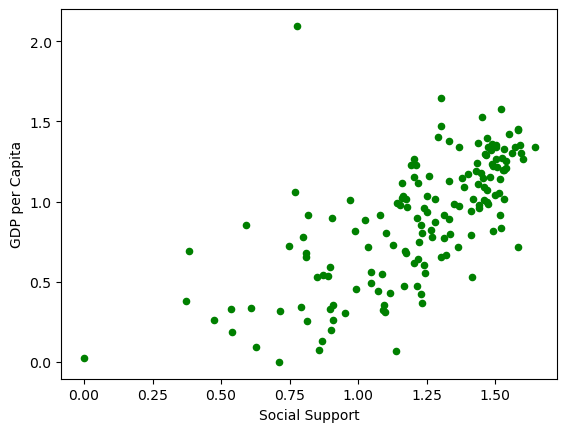

In [40]:
data2018.plot(kind='scatter',x='Social Support',y='GDP per Capita',alpha=1,color='green')
plt.xlabel = 'Social Support'
plt.ylabel = 'GDP per Capita'
plt.show()


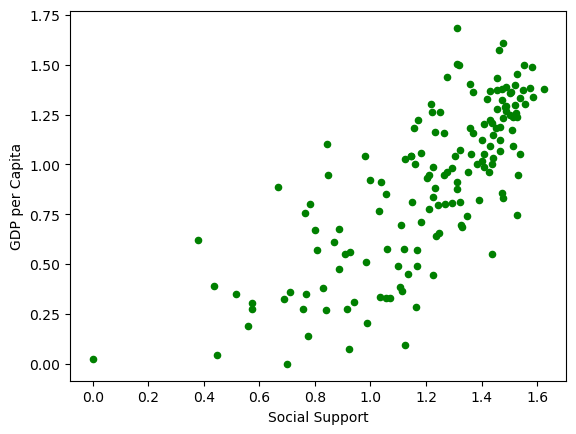

In [41]:
data2019.plot(kind='scatter',x='Social Support',y='GDP per Capita',alpha=1,color='green')
plt.xlabel = 'Social Support'
plt.ylabel = 'GDP per Capita'
plt.show()

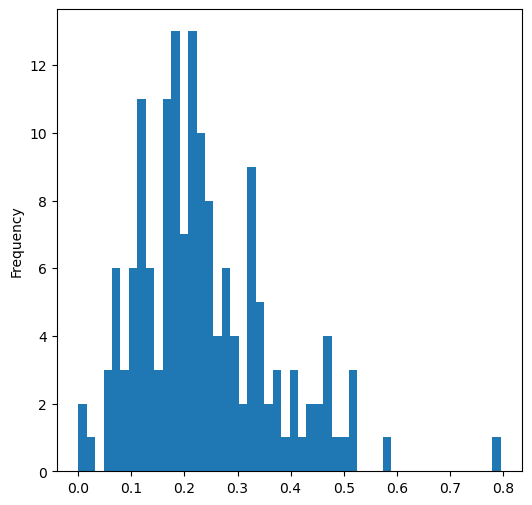

In [42]:
#histogram plot
data2015.Generosity.plot(kind = 'hist',bins =50,figsize = (6,6))
plt.show()

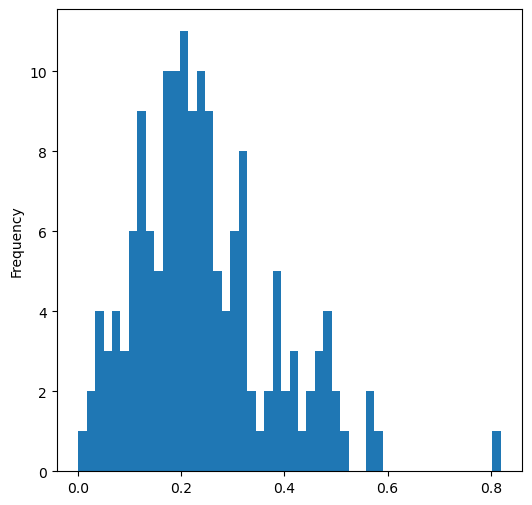

In [43]:
#histogram plot
data2016.Generosity.plot(kind = 'hist',bins = 50,figsize = (6,6))
plt.show()

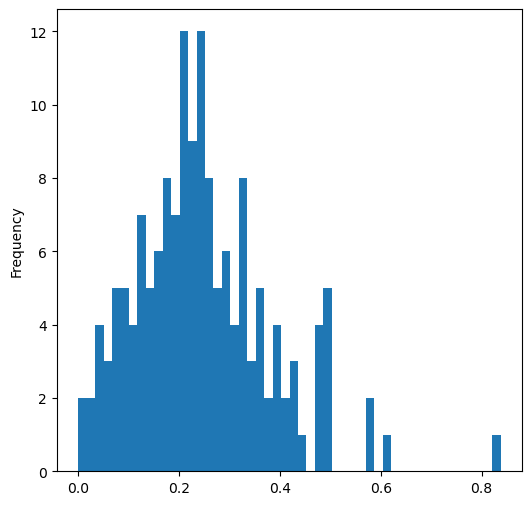

In [44]:
#histogram plot
data2017.Generosity.plot(kind = 'hist',bins = 50,figsize = (6,6))
plt.show()

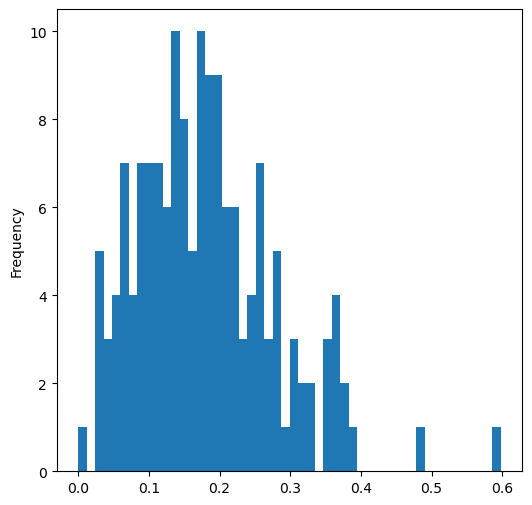

In [45]:
#histogram plot
data2018.Generosity.plot(kind = 'hist',bins = 50,figsize = (6,6))
plt.show()

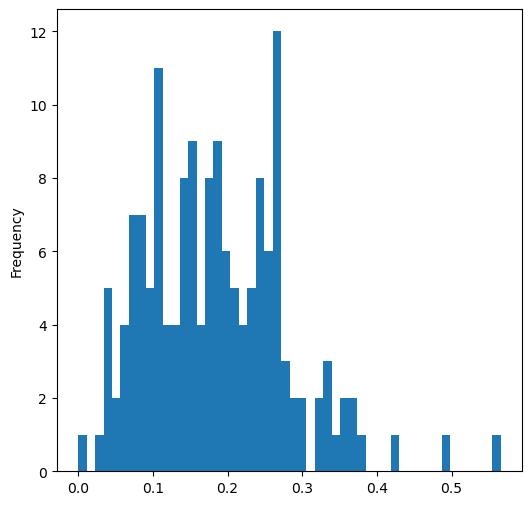

In [46]:
#histogram plot
data2019.Generosity.plot(kind = 'hist',bins = 50,figsize = (6,6))
plt.show()

In [47]:
data2015

,Country,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
0,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678
1,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.14145,0.43630
2,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.48357,0.34139
3,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.36503,0.34699
4,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.32957,0.45811
...,...,...,...,...,...,...,...,...
153,Rwanda,3.465,0.22208,0.77370,0.42864,0.59201,0.55191,0.22628
154,Benin,3.340,0.28665,0.35386,0.31910,0.48450,0.08010,0.18260
155,Syria,3.006,0.66320,0.47489,0.72193,0.15684,0.18906,0.47179
156,Burundi,2.905,0.01530,0.41587,0.22396,0.11850,0.10062,0.19727


In [48]:
data2016

,Country,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
0,Denmark,7.526,1.44178,1.16374,0.79504,0.57941,0.44453,0.36171
1,Switzerland,7.509,1.52733,1.14524,0.86303,0.58557,0.41203,0.28083
2,Iceland,7.501,1.42666,1.18326,0.86733,0.56624,0.14975,0.47678
3,Norway,7.498,1.57744,1.12690,0.79579,0.59609,0.35776,0.37895
4,Finland,7.413,1.40598,1.13464,0.81091,0.57104,0.41004,0.25492
...,...,...,...,...,...,...,...,...
152,Benin,3.484,0.39499,0.10419,0.21028,0.39747,0.06681,0.20180
153,Afghanistan,3.360,0.38227,0.11037,0.17344,0.16430,0.07112,0.31268
154,Togo,3.303,0.28123,0.00000,0.24811,0.34678,0.11587,0.17517
155,Syria,3.069,0.74719,0.14866,0.62994,0.06912,0.17233,0.48397


In [49]:
data2017

,Country,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
0,Norway,7.537,1.616463,1.533524,0.796667,0.635423,0.315964,0.362012
1,Denmark,7.522,1.482383,1.551122,0.792566,0.626007,0.400770,0.355280
2,Iceland,7.504,1.480633,1.610574,0.833552,0.627163,0.153527,0.475540
3,Switzerland,7.494,1.564980,1.516912,0.858131,0.620071,0.367007,0.290549
4,Finland,7.469,1.443572,1.540247,0.809158,0.617951,0.382612,0.245483
...,...,...,...,...,...,...,...,...
150,Rwanda,3.471,0.368746,0.945707,0.326425,0.581844,0.455220,0.252756
151,Syria,3.462,0.777153,0.396103,0.500533,0.081539,0.151347,0.493664
152,Tanzania,3.349,0.511136,1.041990,0.364509,0.390018,0.066035,0.354256
153,Burundi,2.905,0.091623,0.629794,0.151611,0.059901,0.084148,0.204435


In [50]:
data2018

,Country,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
0,Finland,7.632,1.305,1.592,0.874,0.681,0.393,0.202
1,Norway,7.594,1.456,1.582,0.861,0.686,0.340,0.286
2,Denmark,7.555,1.351,1.590,0.868,0.683,0.408,0.284
3,Iceland,7.495,1.343,1.644,0.914,0.677,0.138,0.353
4,Switzerland,7.487,1.420,1.549,0.927,0.660,0.357,0.256
...,...,...,...,...,...,...,...,...
151,Yemen,3.355,0.442,1.073,0.343,0.244,0.064,0.083
152,Tanzania,3.303,0.455,0.991,0.381,0.481,0.097,0.270
153,South Sudan,3.254,0.337,0.608,0.177,0.112,0.106,0.224
154,Central African Republic,3.083,0.024,0.000,0.010,0.305,0.038,0.218


In [51]:
data2019

,Country,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
0,Finland,7.769,1.340,1.587,0.986,0.596,0.393,0.153
1,Denmark,7.600,1.383,1.573,0.996,0.592,0.410,0.252
2,Norway,7.554,1.488,1.582,1.028,0.603,0.341,0.271
3,Iceland,7.494,1.380,1.624,1.026,0.591,0.118,0.354
4,Netherlands,7.488,1.396,1.522,0.999,0.557,0.298,0.322
...,...,...,...,...,...,...,...,...
151,Rwanda,3.334,0.359,0.711,0.614,0.555,0.411,0.217
152,Tanzania,3.231,0.476,0.885,0.499,0.417,0.147,0.276
153,Afghanistan,3.203,0.350,0.517,0.361,0.000,0.025,0.158
154,Central African Republic,3.083,0.026,0.000,0.105,0.225,0.035,0.235


In [52]:
data2015.describe()

,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
count,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000
mean,5.375734,0.846137,0.991046,0.630259,0.428615,0.143422,0.237296
std,1.145010,0.403121,0.272369,0.247078,0.150693,0.120034,0.126685
min,2.839000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.526000,0.545808,0.856823,0.439185,0.328330,0.061675,0.150553
50%,5.232500,0.910245,1.029510,0.696705,0.435515,0.107220,0.216130
75%,6.243750,1.158448,1.214405,0.811013,0.549092,0.180255,0.309883
max,7.587000,1.690420,1.402230,1.025250,0.669730,0.551910,0.795880


In [53]:
data2016.describe()

,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
count,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000
mean,5.382185,0.953880,0.793621,0.557619,0.370994,0.137624,0.242635
std,1.141674,0.412595,0.266706,0.229349,0.145507,0.111038,0.133756
min,2.905000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.404000,0.670240,0.641840,0.382910,0.257480,0.061260,0.154570
50%,5.314000,1.027800,0.841420,0.596590,0.397470,0.105470,0.222450
75%,6.269000,1.279640,1.021520,0.729930,0.484530,0.175540,0.311850
max,7.526000,1.824270,1.183260,0.952770,0.608480,0.505210,0.819710


In [54]:
data2017.describe()

,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
count,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000
mean,5.354019,0.984718,1.188898,0.551341,0.408786,0.123120,0.246883
std,1.131230,0.420793,0.287263,0.237073,0.149997,0.101661,0.134780
min,2.693000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.505500,0.663371,1.042635,0.369866,0.303677,0.057271,0.154106
50%,5.279000,1.064578,1.253918,0.606042,0.437454,0.089848,0.231538
75%,6.101500,1.318027,1.414316,0.723008,0.516561,0.153296,0.323762
max,7.537000,1.870766,1.610574,0.949492,0.658249,0.464308,0.838075


In [55]:
data2018.describe()

,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
count,156.000000,156.000000,156.000000,156.000000,156.000000,155.000000,156.000000
mean,5.375917,0.891449,1.213237,0.597346,0.454506,0.112000,0.181006
std,1.119506,0.391921,0.302372,0.247579,0.162424,0.096492,0.098471
min,2.905000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.453750,0.616250,1.066750,0.422250,0.356000,0.051000,0.109500
50%,5.378000,0.949500,1.255000,0.644000,0.487000,0.082000,0.174000
75%,6.168500,1.197750,1.463000,0.777250,0.578500,0.137000,0.239000
max,7.632000,2.096000,1.644000,1.030000,0.724000,0.457000,0.598000


In [56]:
data2019.describe()

,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
count,156.000000,156.000000,156.000000,156.000000,156.000000,156.000000,156.000000
mean,5.407096,0.905147,1.208814,0.725244,0.392571,0.110603,0.184846
std,1.113120,0.398389,0.299191,0.242124,0.143289,0.094538,0.095254
min,2.853000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.544500,0.602750,1.055750,0.547750,0.308000,0.047000,0.108750
50%,5.379500,0.960000,1.271500,0.789000,0.417000,0.085500,0.177500
75%,6.184500,1.232500,1.452500,0.881750,0.507250,0.141250,0.248250
max,7.769000,1.684000,1.624000,1.141000,0.631000,0.453000,0.566000


In [57]:
#Filtering
filtered_data = data2015['Freedom'] > 0.65
data2015[filtered_data]

,Country,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
0,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678
3,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.36503,0.34699
7,Sweden,7.364,1.33171,1.28907,0.91087,0.65980,0.43844,0.36262
9,Australia,7.284,1.33358,1.30923,0.93156,0.65124,0.35637,0.43562
43,Uzbekistan,6.003,0.63244,1.34043,0.59772,0.65821,0.30826,0.22837
144,Cambodia,3.819,0.46038,0.62736,0.61114,0.66246,0.07247,0.40359


In [58]:
#Filtering with use logical_and method
data2015[np.logical_and(data2015['Freedom']>0.65, data2015['Social Support']>1.34)]

,Country,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
0,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678
43,Uzbekistan,6.003,0.63244,1.34043,0.59772,0.65821,0.30826,0.22837


In [59]:
#Let's use for loop on this project
for index,value in data2015[['Social Support']][0:2].iterrows():
    print("index: ",index,"value: ",value)

index:  0 value:  Social Support    1.34951
Name: 0, dtype: float64
index:  1 value:  Social Support    1.40223
Name: 1, dtype: float64


In [60]:
#List comprehension usage
#average = sum(data2015.'Social Support')/len(data2015.'Social Support')
#average=data2015['Social Support'].mean()
#data2015["Happiness Score"] = ["Above Average" if i>average else "Average" if i==average else "Below Average" for i in data2015.Family]
#data2015.columns #We'll see Family_Situtation is in our columns right now!
#data2015.head()

In [61]:
#Use a filter for see the Below Average countries
#filtered_data = data2015.Family_Situtation =="Below Average"
#data2015[filtered_data]

In [62]:
#data2015.boxplot(column='Social Support',by='GDP per Capita')
#plt.show()

In [63]:
#create a small data from data2015
smaller_data = data2015.tail()
smaller_data

,Country,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
153,Rwanda,3.465,0.22208,0.77370,0.42864,0.59201,0.55191,0.22628
154,Benin,3.340,0.28665,0.35386,0.31910,0.48450,0.08010,0.18260
155,Syria,3.006,0.66320,0.47489,0.72193,0.15684,0.18906,0.47179
156,Burundi,2.905,0.01530,0.41587,0.22396,0.11850,0.10062,0.19727
157,Togo,2.839,0.20868,0.13995,0.28443,0.36453,0.10731,0.16681


In [64]:
melted_data = pd.melt(frame=smaller_data,id_vars='Country',value_vars=['Generosity','Social Support'])
melted_data

,Country,variable,value
0,Rwanda,Generosity,0.22628
1,Benin,Generosity,0.18260
2,Syria,Generosity,0.47179
3,Burundi,Generosity,0.19727
4,Togo,Generosity,0.16681
5,Rwanda,Social Support,0.77370
6,Benin,Social Support,0.35386
7,Syria,Social Support,0.47489
8,Burundi,Social Support,0.41587
9,Togo,Social Support,0.13995


In [65]:
#pivot method is used for reverse of melting.
melted_data.pivot(index='Country',columns='variable',values='value')

variable,Generosity,Social Support
Country,,
Benin,0.18260,0.35386
Burundi,0.19727,0.41587
Rwanda,0.22628,0.77370
Syria,0.47179,0.47489
Togo,0.16681,0.13995


In [66]:
#concatenate datas
data1 = data2015.head()
data2 = data2015.tail()
concat_data = pd.concat([data1,data2],axis=0,ignore_index=False)
#'[data1,data2]' means concat data1 and data2
#'axis=0' means adds dataframes in row
#'ignore_index = True' means give new indexes our datas. Firstly, Rwanda's index was 153 but we ignore it and its index is 5 now.
concat_data

,Country,Happiness Score,GDP per Capita,Social Support,Life Expectancy/Health,Freedom,Trust (government corruption),Generosity
0,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678
1,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.14145,0.43630
2,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.48357,0.34139
3,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.36503,0.34699
4,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.32957,0.45811
153,Rwanda,3.465,0.22208,0.77370,0.42864,0.59201,0.55191,0.22628
154,Benin,3.340,0.28665,0.35386,0.31910,0.48450,0.08010,0.18260
155,Syria,3.006,0.66320,0.47489,0.72193,0.15684,0.18906,0.47179
156,Burundi,2.905,0.01530,0.41587,0.22396,0.11850,0.10062,0.19727
157,Togo,2.839,0.20868,0.13995,0.28443,0.36453,0.10731,0.16681


In [67]:
#adds dataframes in columns
data1 = data2015['Social Support'].head()
data2 =data2015['Generosity'].head()
concat1_data = pd.concat([data1,data2],axis=1)
concat1_data

,Social Support,Generosity
0,1.34951,0.29678
1,1.40223,0.43630
2,1.36058,0.34139
3,1.33095,0.34699
4,1.32261,0.45811


<Axes: >

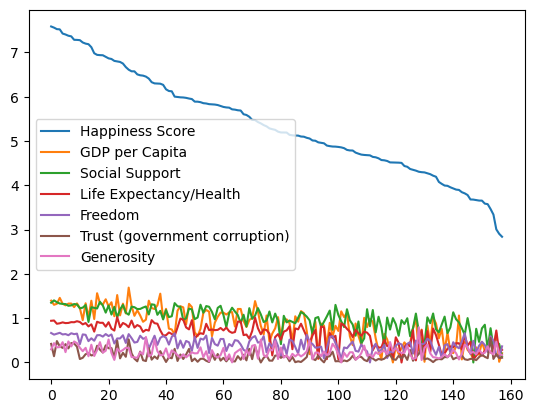

In [68]:
data_plot = data2015.loc[:,["Happiness Score","GDP per Capita","Social Support","Life Expectancy/Health","Freedom","Trust (government corruption)","Generosity"]]
data_plot.plot()

<Axes: >

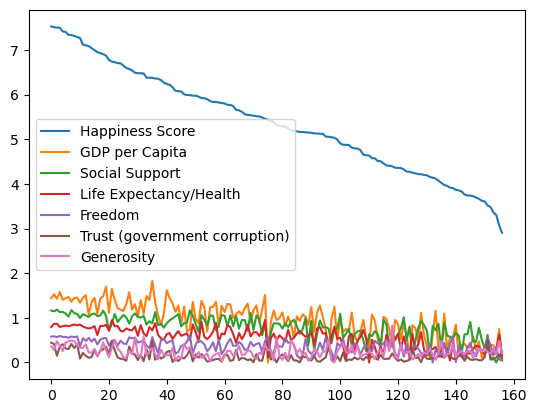

In [69]:
data_plot = data2016.loc[:,["Happiness Score","GDP per Capita","Social Support","Life Expectancy/Health","Freedom","Trust (government corruption)","Generosity"]]
data_plot.plot()

<Axes: >

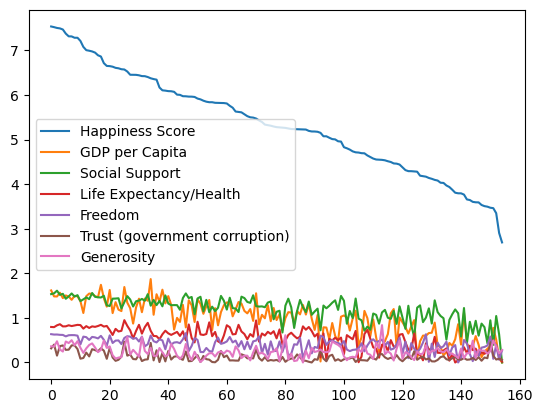

In [70]:
data_plot = data2017.loc[:,["Happiness Score","GDP per Capita","Social Support","Life Expectancy/Health","Freedom","Trust (government corruption)","Generosity"]]
data_plot.plot()

<Axes: >

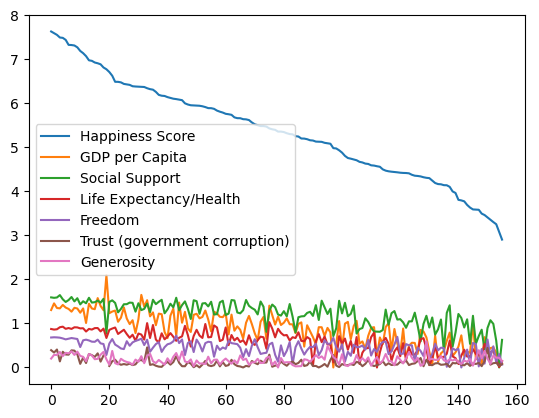

In [71]:
data_plot = data2018.loc[:,["Happiness Score","GDP per Capita","Social Support","Life Expectancy/Health","Freedom","Trust (government corruption)","Generosity"]]
data_plot.plot()

<Axes: >

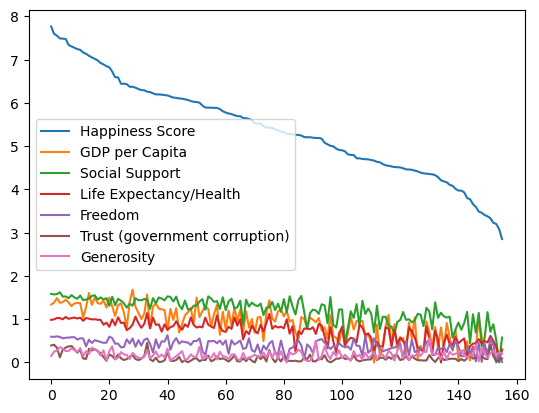

In [72]:
data_plot = data2019.loc[:,["Happiness Score","GDP per Capita","Social Support","Life Expectancy/Health","Freedom","Trust (government corruption)","Generosity"]]
data_plot.plot()

array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >], dtype=object)

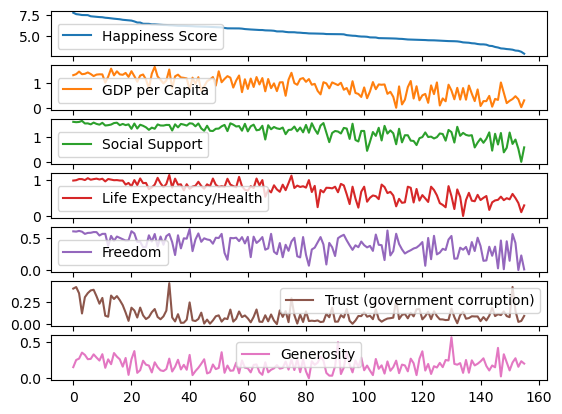

In [73]:
data_plot.plot(subplots = True)

In [74]:
#data2015.Region.unique()

In [75]:
##visualization

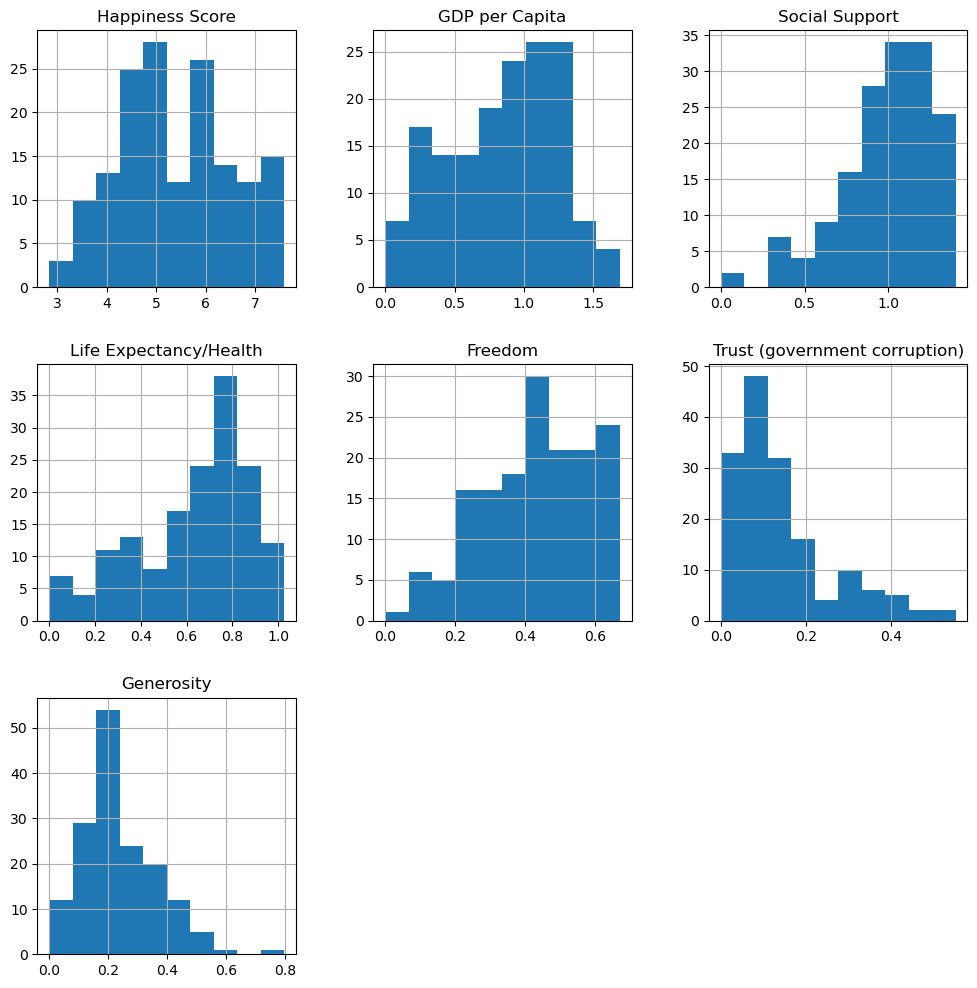

In [76]:
# distribution of all numeric data
plt.rcParams['figure.figsize'] = (12, 12)
data2015.hist();

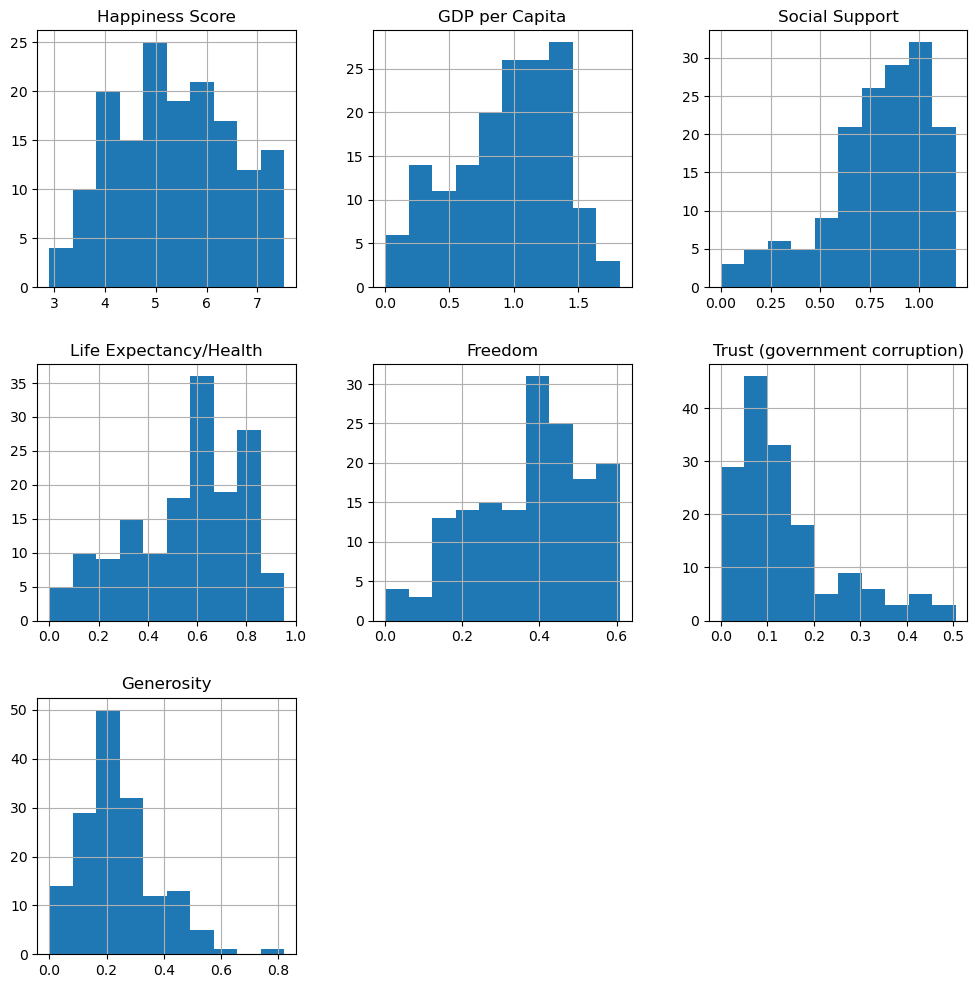

In [77]:
# distribution of all numeric data
plt.rcParams['figure.figsize'] = (12, 12)
data2016.hist();

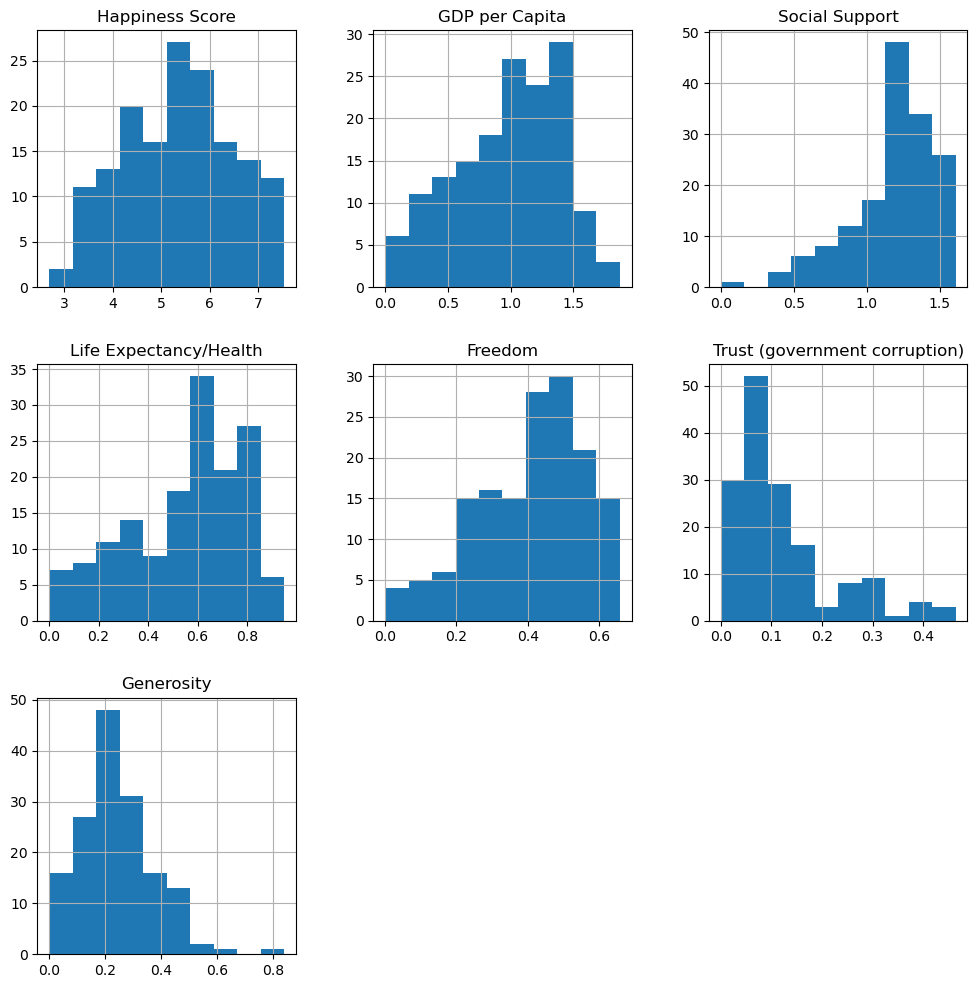

In [78]:
# distribution of all numeric data
plt.rcParams['figure.figsize'] = (12, 12)
data2017.hist();

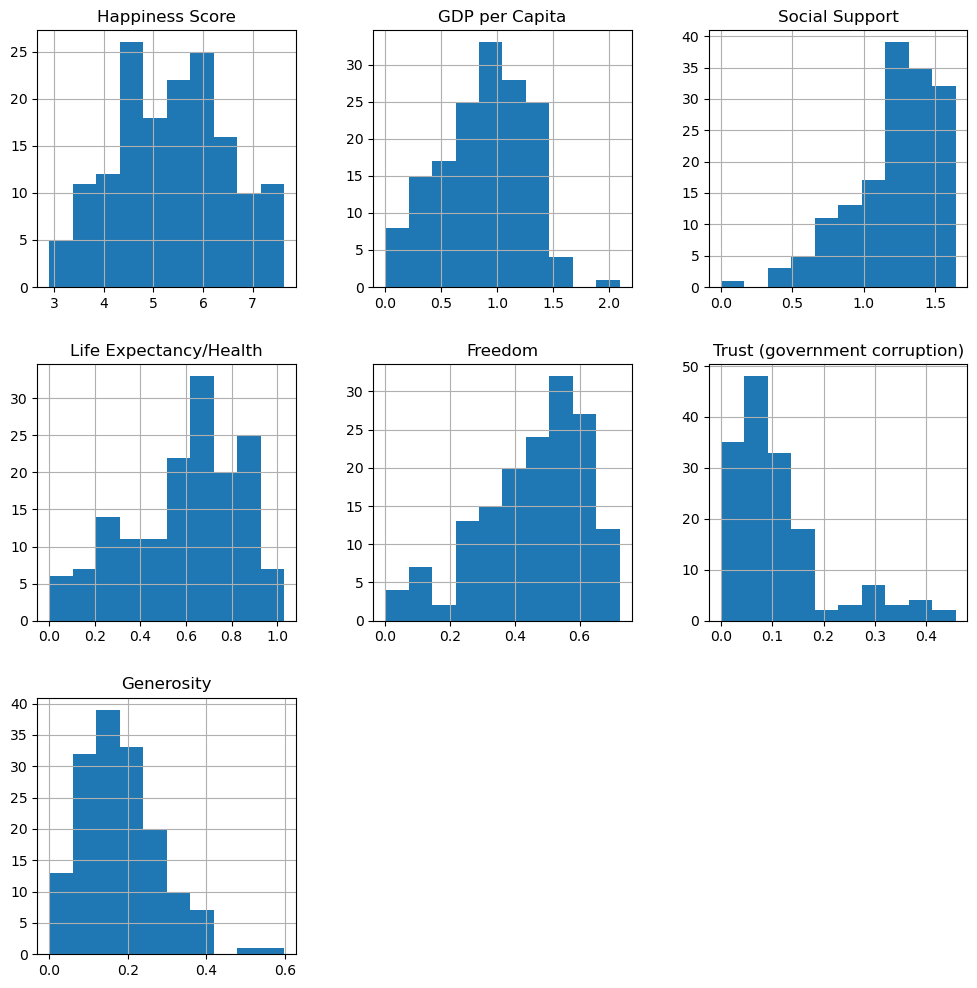

In [79]:
# distribution of all numeric data
plt.rcParams['figure.figsize'] = (12, 12)
data2018.hist();

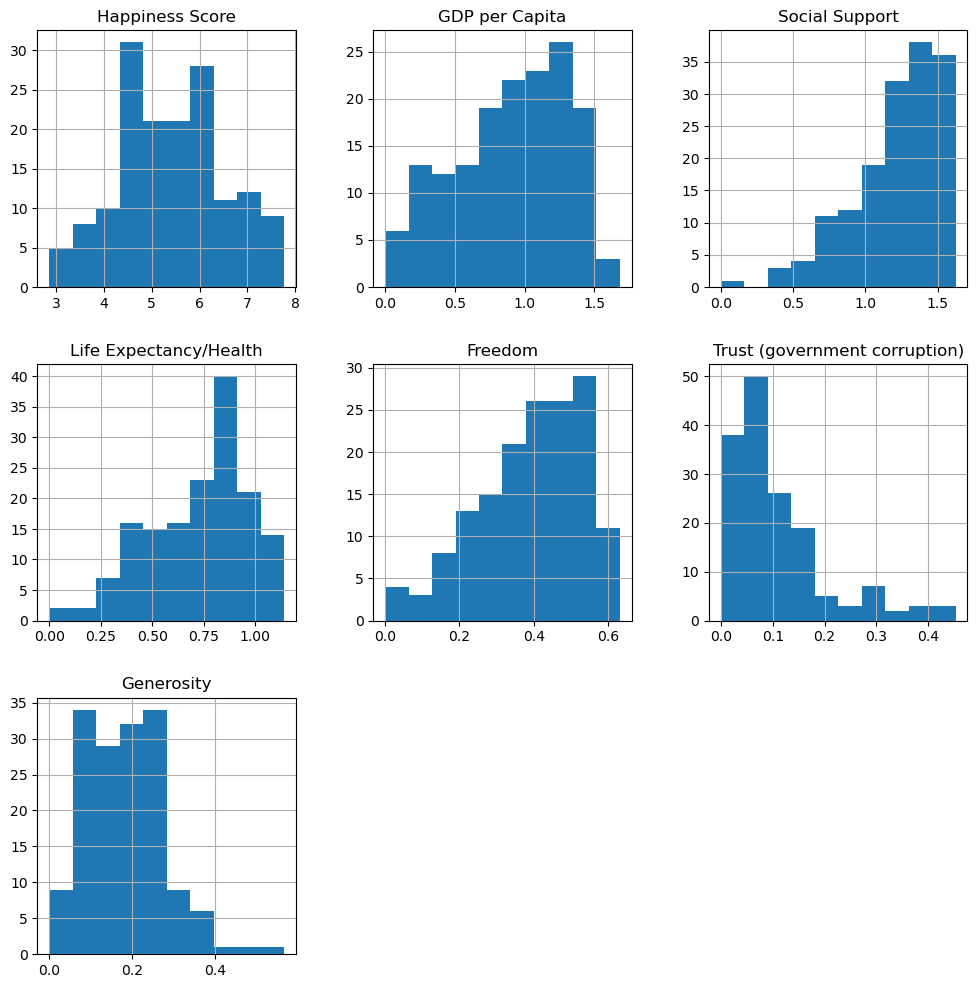

In [80]:
# distribution of all numeric data
plt.rcParams['figure.figsize'] = (12, 12)
data2019.hist();

In [81]:
data2015[['Country','Social Support']].head(10)

,Country,Social Support
0,Switzerland,1.34951
1,Iceland,1.40223
2,Denmark,1.36058
3,Norway,1.33095
4,Canada,1.32261
5,Finland,1.31826
6,Netherlands,1.28017
7,Sweden,1.28907
8,New Zealand,1.31967
9,Australia,1.30923


In [82]:
data2015[['Country','Social Support']].tail(10)

,Country,Social Support
148,Chad,0.76062
149,Guinea,0.46475
150,Ivory Coast,0.77115
151,Burkina Faso,0.85188
152,Afghanistan,0.30285
153,Rwanda,0.77370
154,Benin,0.35386
155,Syria,0.47489
156,Burundi,0.41587
157,Togo,0.13995


Text(0.5, 1.0, 'Top 10 Happiest Countries')

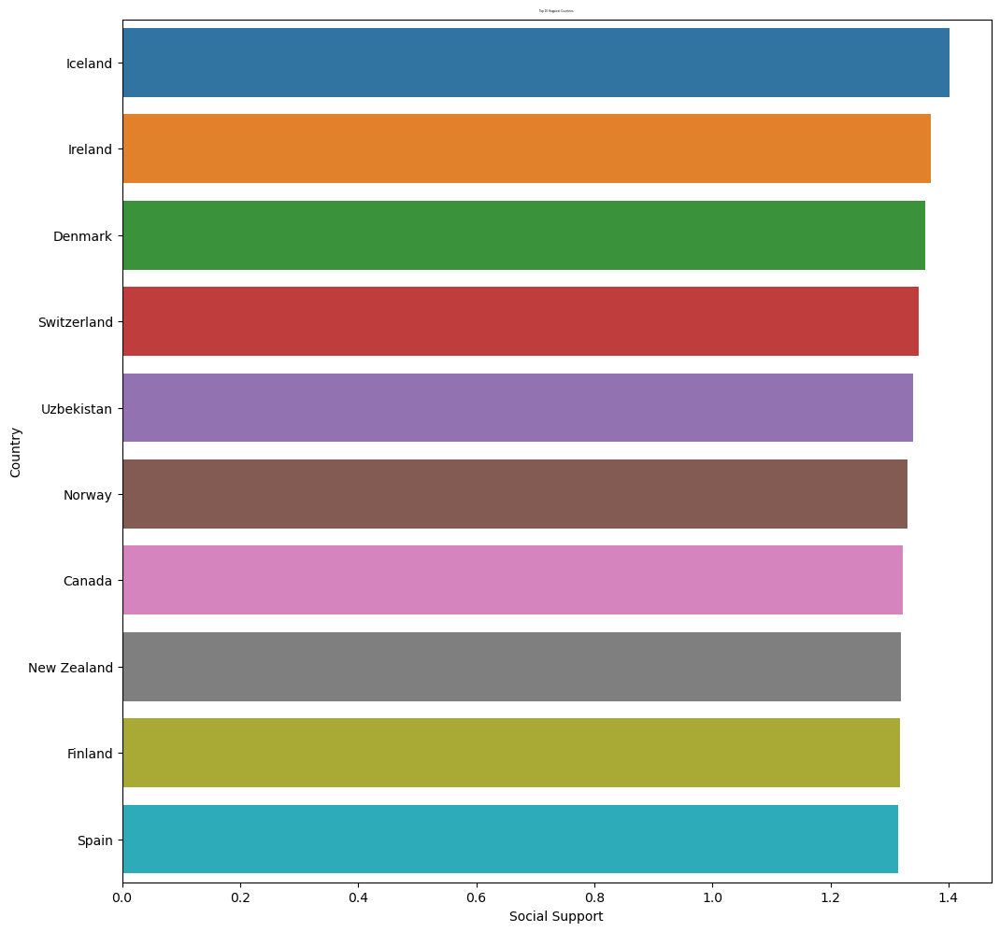

In [83]:
top = data2015.sort_values(['Social Support'],ascending = 0)[:10]
ax = sns.barplot(x ='Social Support' , y = 'Country' , data = top)
ax.set_xlabel('Social Support', size = 10)
ax.set_ylabel('Country', size = 10)
ax.set_title("Top 10 Happiest Countries", size = 2)

Text(0.5, 1.0, 'Top 10 Healthiest Countries')

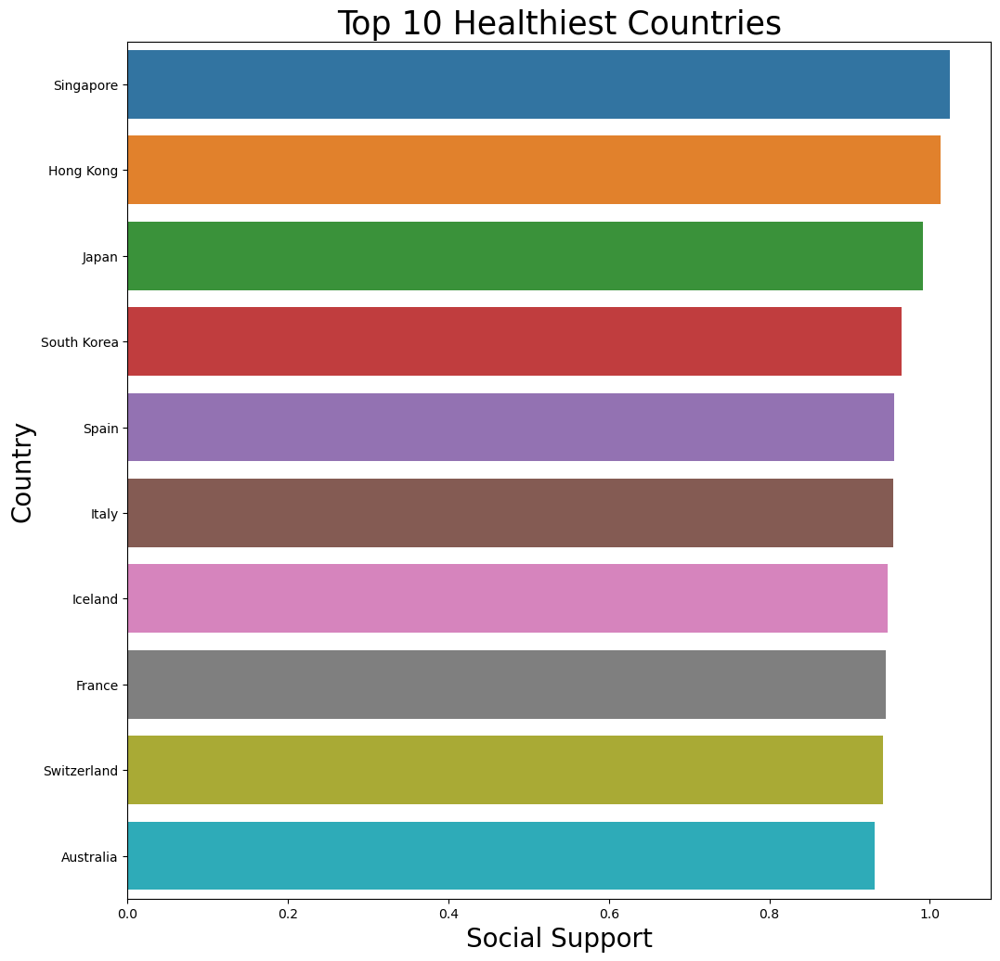

In [84]:
top = data2015.sort_values(['Life Expectancy/Health'],ascending = 0)[:10]
ax = sns.barplot(x = 'Life Expectancy/Health' , y = 'Country' , data = top)
ax.set_xlabel('Social Support', size = 20)
ax.set_ylabel('Country', size = 20)
ax.set_title("Top 10 Healthiest Countries", size = 25)

In [85]:
data2016[['Country','Happiness Score']].head(10)

,Country,Happiness Score
0,Denmark,7.526
1,Switzerland,7.509
2,Iceland,7.501
3,Norway,7.498
4,Finland,7.413
5,Canada,7.404
6,Netherlands,7.339
7,New Zealand,7.334
8,Australia,7.313
9,Sweden,7.291


In [86]:
data2016[['Country','Happiness Score']].tail(10)

,Country,Happiness Score
147,Madagascar,3.695
148,Tanzania,3.666
149,Liberia,3.622
150,Guinea,3.607
151,Rwanda,3.515
152,Benin,3.484
153,Afghanistan,3.360
154,Togo,3.303
155,Syria,3.069
156,Burundi,2.905


Text(0.5, 1.0, 'Top 10 Happiest Countries')

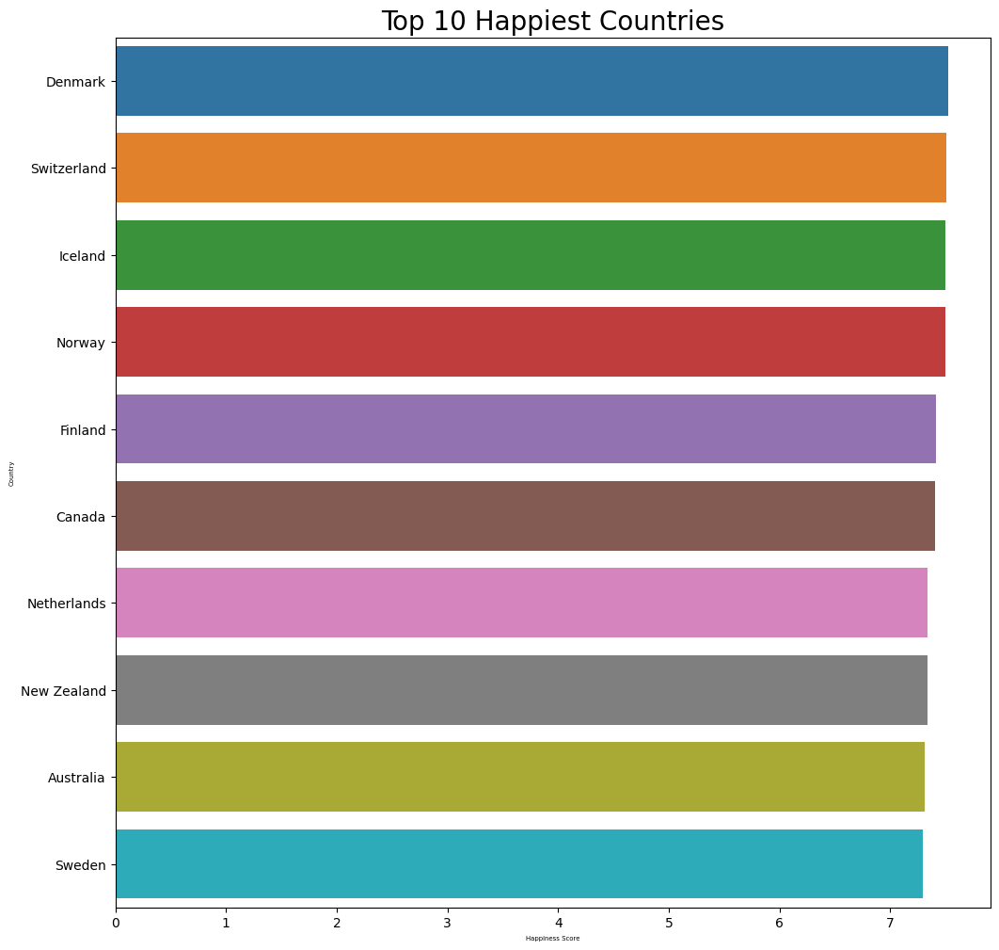

In [87]:
top = data2016.sort_values(['Happiness Score'],ascending = 0)[:10]
ax = sns.barplot(x = 'Happiness Score' , y = 'Country' , data = top)
ax.set_xlabel('Happiness Score', size = 5)
ax.set_ylabel('Country', size = 5)
ax.set_title("Top 10 Happiest Countries", size = 20)

Text(0.5, 1.0, 'Top 10 Healthiest Countries')

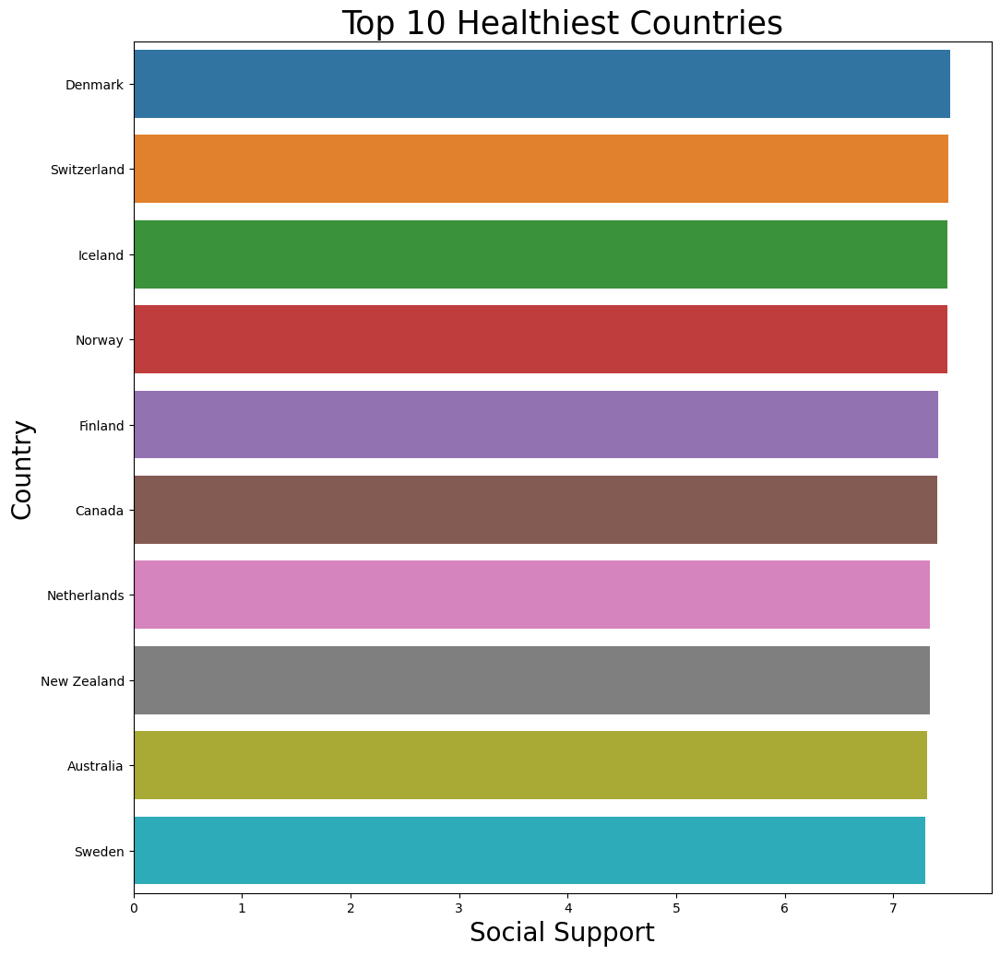

In [88]:
top = data2016.sort_values(['Happiness Score'],ascending = 0)[:10]
ax = sns.barplot(x = 'Happiness Score' , y = 'Country' , data = top)
ax.set_xlabel('Social Support', size = 20)
ax.set_ylabel('Country', size = 20)
ax.set_title("Top 10 Healthiest Countries", size = 25)

In [89]:
data2017[['Country','Happiness Score']].head(10)

,Country,Happiness Score
0,Norway,7.537
1,Denmark,7.522
2,Iceland,7.504
3,Switzerland,7.494
4,Finland,7.469
5,Netherlands,7.377
6,Canada,7.316
7,New Zealand,7.314
8,Sweden,7.284
9,Australia,7.284


In [90]:
data2017[['Country','Happiness Score']].tail(10)

,Country,Happiness Score
145,Yemen,3.593
146,South Sudan,3.591
147,Liberia,3.533
148,Guinea,3.507
149,Togo,3.495
150,Rwanda,3.471
151,Syria,3.462
152,Tanzania,3.349
153,Burundi,2.905
154,Central African Republic,2.693


Text(0.5, 1.0, 'Top 10 Happiest Countries')

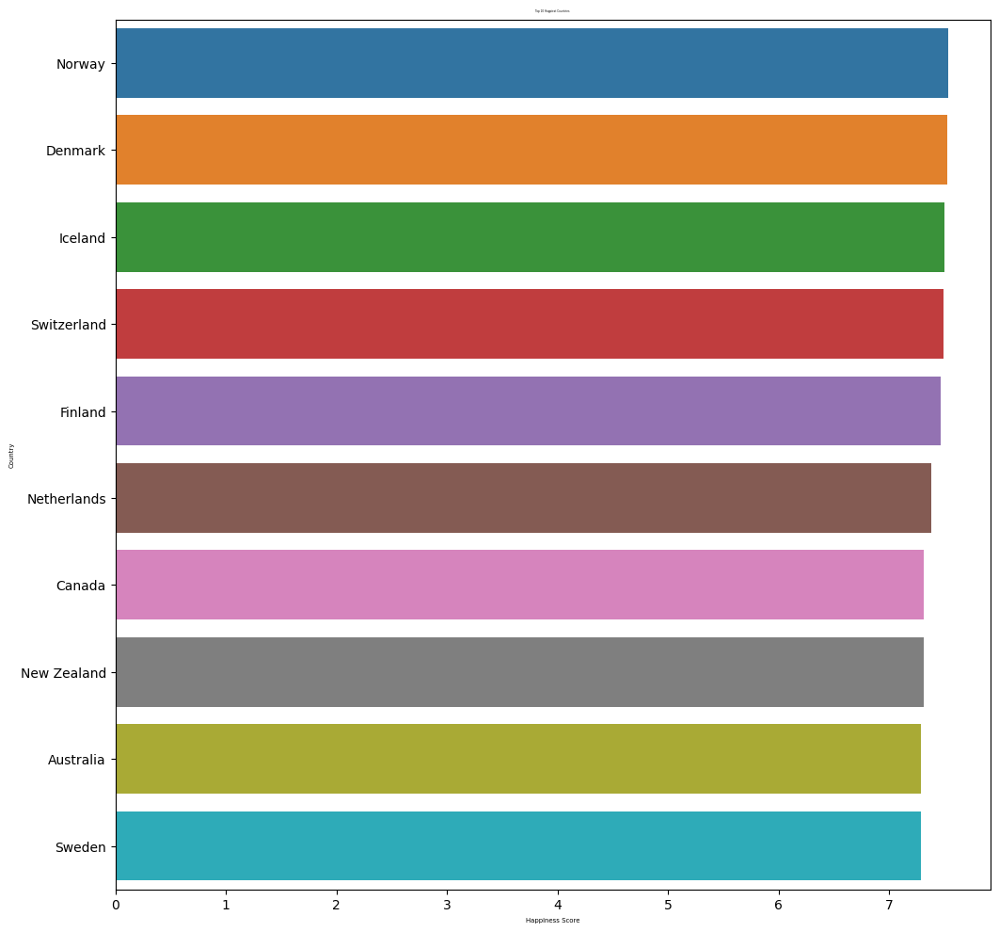

In [91]:
top = data2017.sort_values(['Happiness Score'],ascending = 0)[:10]
ax = sns.barplot(x ='Happiness Score' , y = 'Country' , data = top)
ax.set_xlabel('Happiness Score', size = 5)
ax.set_ylabel('Country', size = 5)
ax.set_title("Top 10 Happiest Countries", size = 2)

Text(0.5, 1.0, 'Top 10 Healthiest Countries')

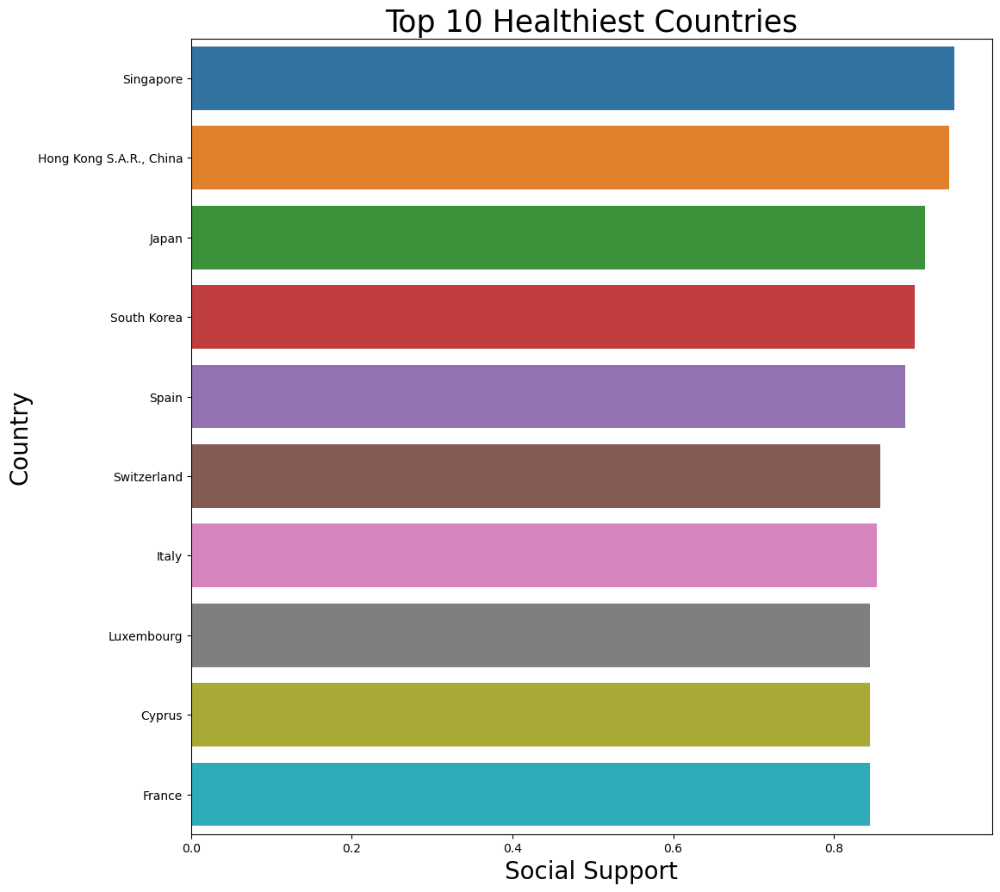

In [92]:
top = data2017.sort_values(['Life Expectancy/Health'],ascending = 0)[:10]
ax = sns.barplot(x = 'Life Expectancy/Health' , y = 'Country' , data = top)
ax.set_xlabel('Social Support', size = 20)
ax.set_ylabel('Country', size = 20)
ax.set_title("Top 10 Healthiest Countries", size = 25)

In [93]:
data2018[['Country','Happiness Score']].head(10)

,Country,Happiness Score
0,Finland,7.632
1,Norway,7.594
2,Denmark,7.555
3,Iceland,7.495
4,Switzerland,7.487
5,Netherlands,7.441
6,Canada,7.328
7,New Zealand,7.324
8,Sweden,7.314
9,Australia,7.272


In [94]:
data2018[['Country','Happiness Score']].tail(10)

,Country,Happiness Score
146,Malawi,3.587
147,Haiti,3.582
148,Liberia,3.495
149,Syria,3.462
150,Rwanda,3.408
151,Yemen,3.355
152,Tanzania,3.303
153,South Sudan,3.254
154,Central African Republic,3.083
155,Burundi,2.905


Text(0.5, 1.0, 'Top 10 Happiest Countries')

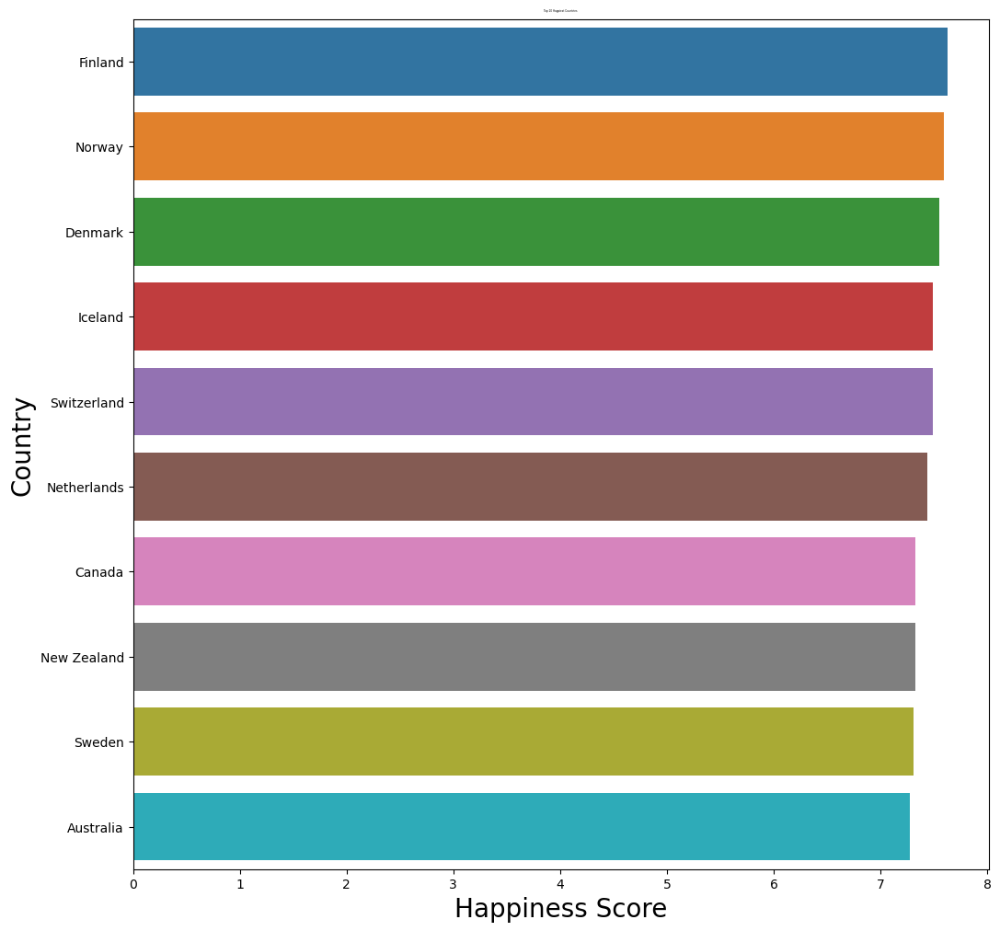

In [95]:
top = data2018.sort_values(['Happiness Score'],ascending = 0)[:10]
ax = sns.barplot(x ='Happiness Score' , y = 'Country' , data = top)
ax.set_xlabel('Happiness Score', size = 20)
ax.set_ylabel('Country', size = 20)
ax.set_title("Top 10 Happiest Countries", size = 2)

Text(0.5, 1.0, 'Top 10 Healthiest Countries')

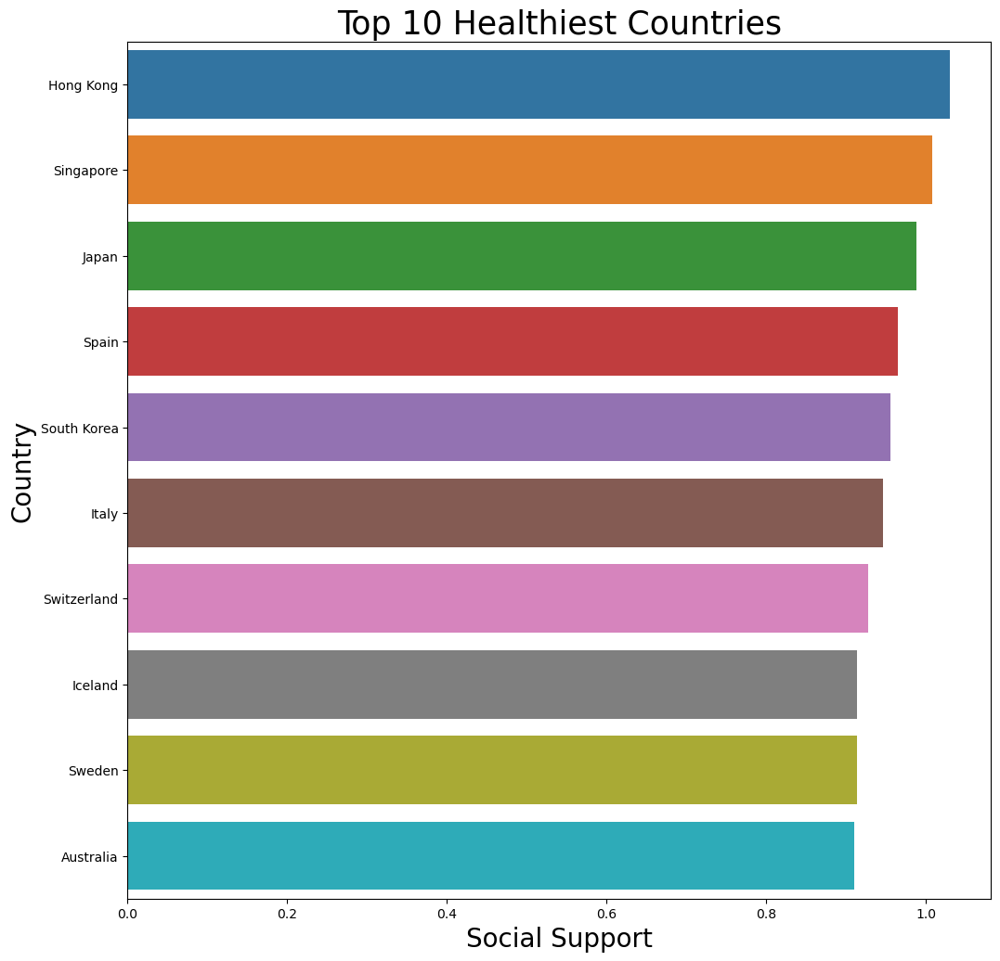

In [96]:
top = data2018.sort_values(['Life Expectancy/Health'],ascending = 0)[:10]
ax = sns.barplot(x = 'Life Expectancy/Health' , y = 'Country' , data = top)
ax.set_xlabel('Social Support', size = 20)
ax.set_ylabel('Country', size = 20)
ax.set_title("Top 10 Healthiest Countries", size = 25)

Text(0.5, 1.0, 'Top 10 Social Support Countries')

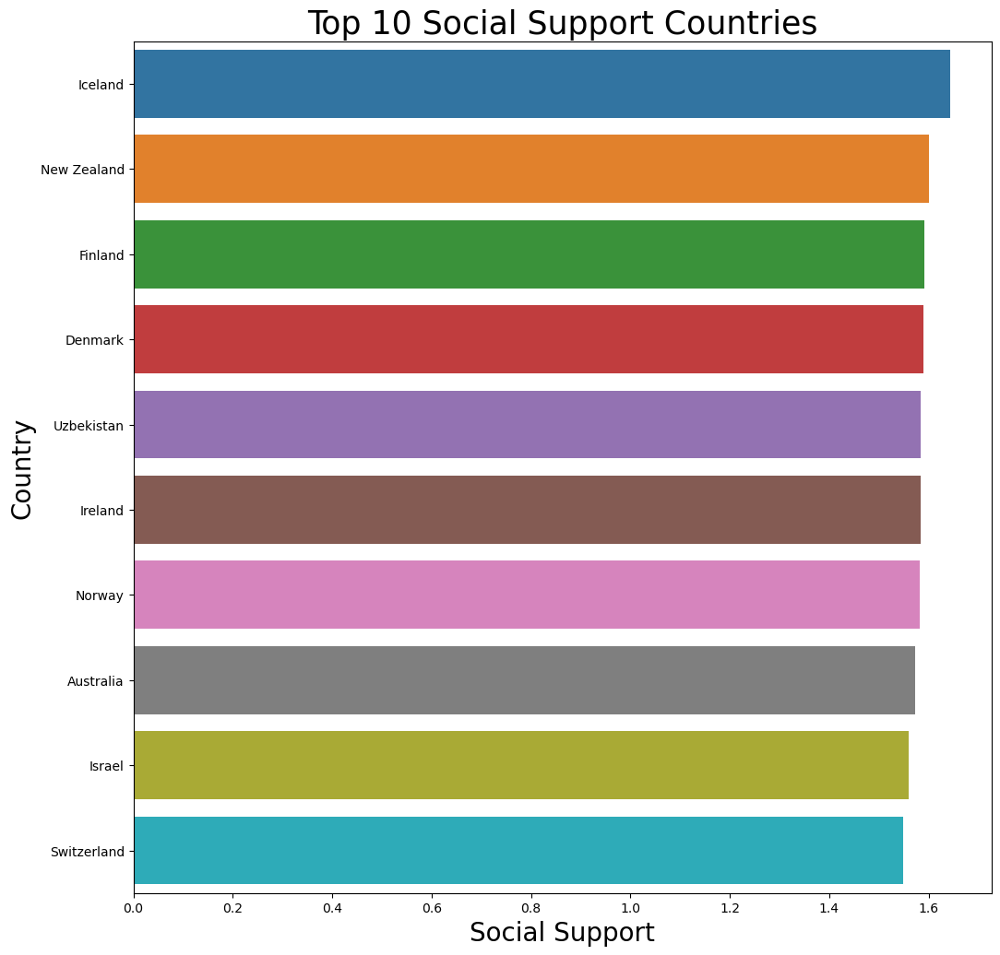

In [97]:
top = data2018.sort_values(['Social Support'],ascending = 0)[:10]
ax = sns.barplot(x = 'Social Support' , y = 'Country' , data = top)
ax.set_xlabel('Social Support', size = 20)
ax.set_ylabel('Country', size = 20)
ax.set_title("Top 10 Social Support Countries", size = 25)

In [98]:
data2019[['Country','Social Support']].head(10)

,Country,Social Support
0,Finland,1.587
1,Denmark,1.573
2,Norway,1.582
3,Iceland,1.624
4,Netherlands,1.522
5,Switzerland,1.526
6,Sweden,1.487
7,New Zealand,1.557
8,Canada,1.505
9,Austria,1.475


In [99]:
data2019[['Country','Social Support']].tail(10)

,Country,Social Support
146,Haiti,0.688
147,Botswana,1.145
148,Syria,0.378
149,Malawi,0.560
150,Yemen,1.163
151,Rwanda,0.711
152,Tanzania,0.885
153,Afghanistan,0.517
154,Central African Republic,0.000
155,South Sudan,0.575


Text(0.5, 1.0, 'Top 10 Happiest Countries')

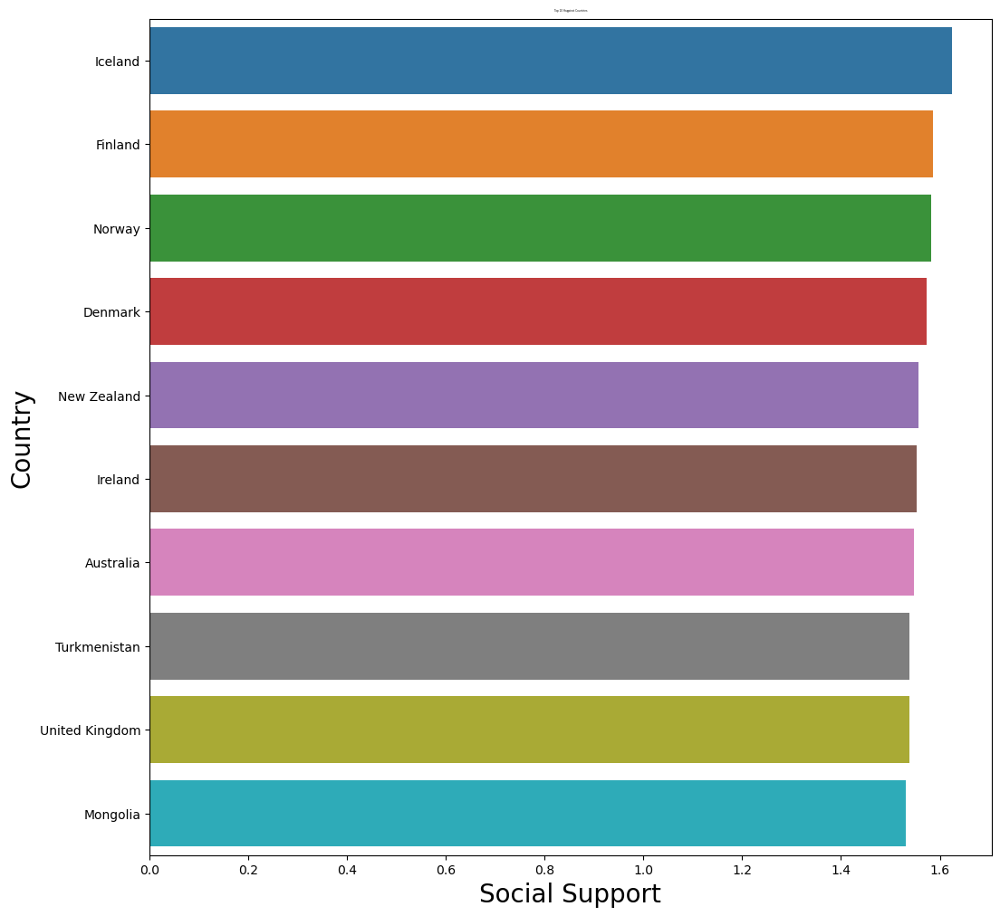

In [100]:
top = data2019.sort_values(['Social Support'],ascending = 0)[:10]
ax = sns.barplot(x ='Social Support' , y = 'Country' , data = top)
ax.set_xlabel('Social Support', size = 20)
ax.set_ylabel('Country', size = 20)
ax.set_title("Top 10 Happiest Countries", size = 2)

In [102]:
data2015[['Country','Life Expectancy/Health']].head(10)

,Country,Life Expectancy/Health
0,Switzerland,0.94143
1,Iceland,0.94784
2,Denmark,0.87464
3,Norway,0.88521
4,Canada,0.90563
5,Finland,0.88911
6,Netherlands,0.89284
7,Sweden,0.91087
8,New Zealand,0.90837
9,Australia,0.93156


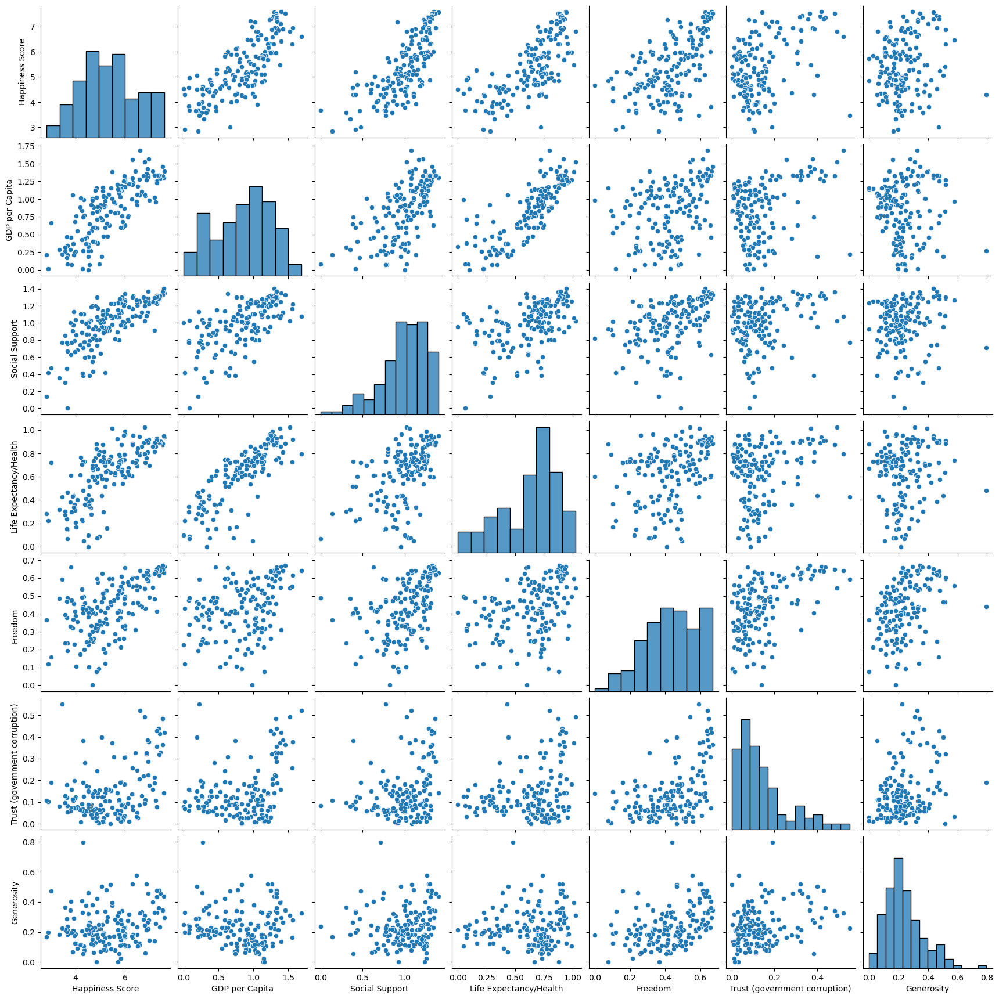

In [103]:
sns.pairplot(data2015)

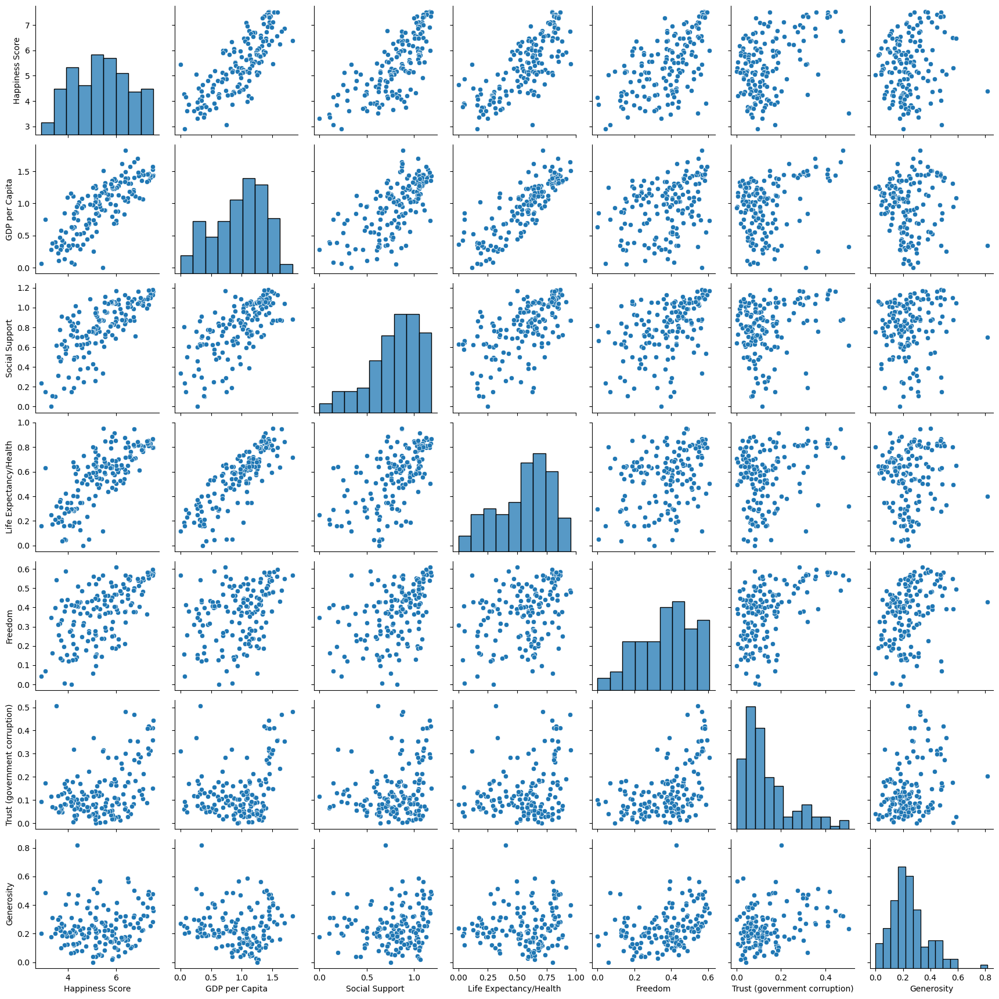

In [104]:
sns.pairplot(data2016)

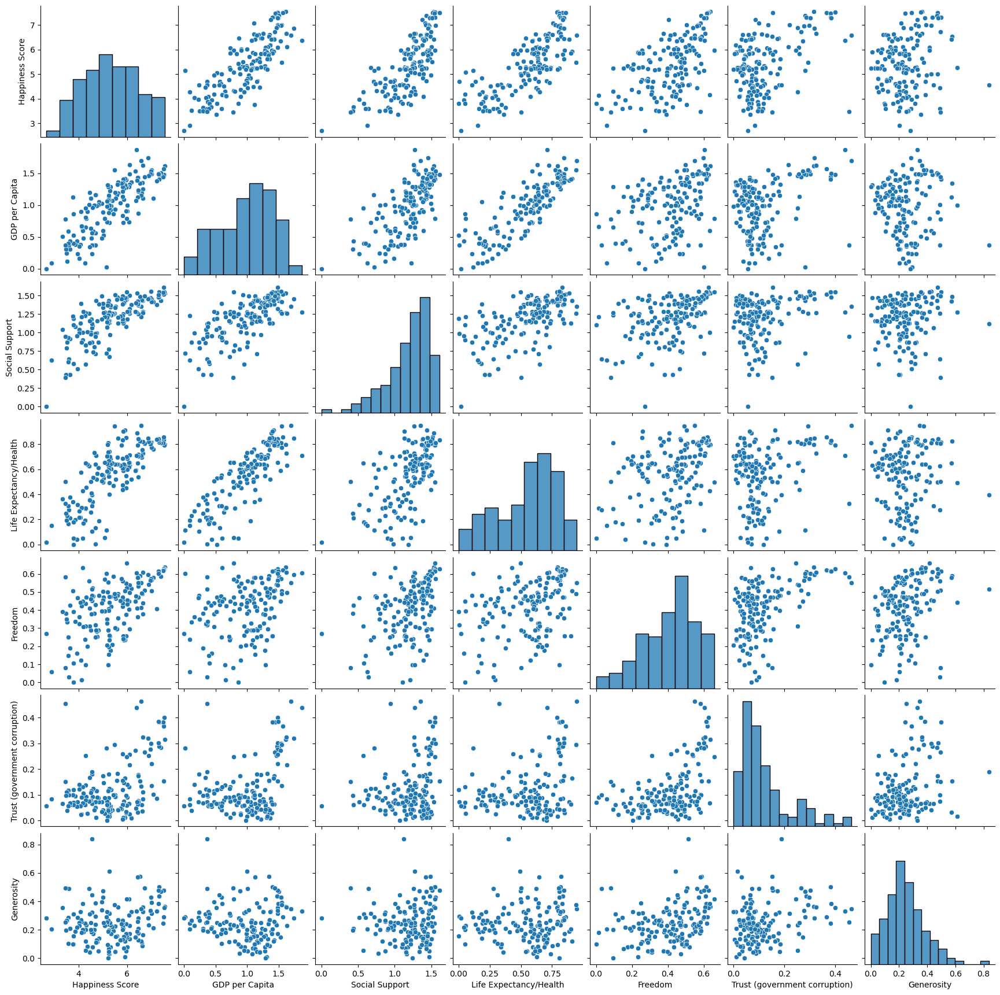

In [105]:
sns.pairplot(data2017)

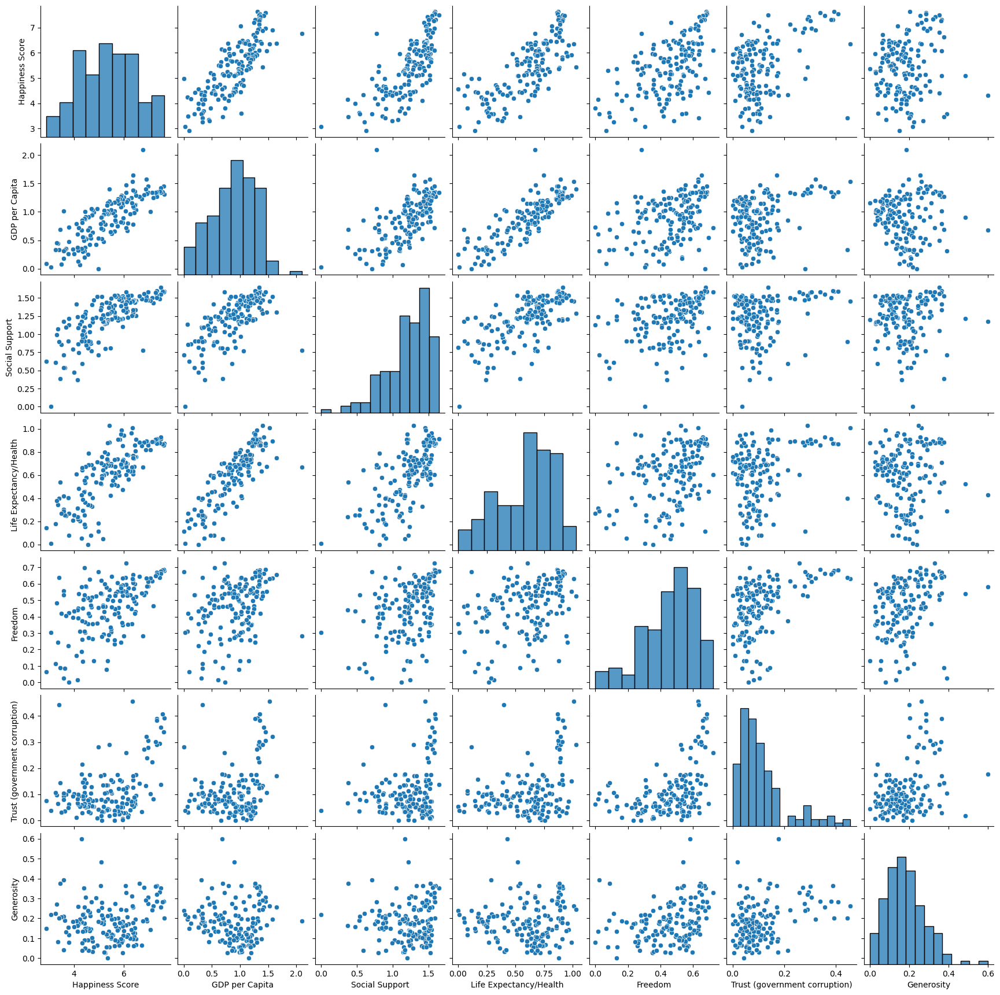

In [106]:
sns.pairplot(data2018)

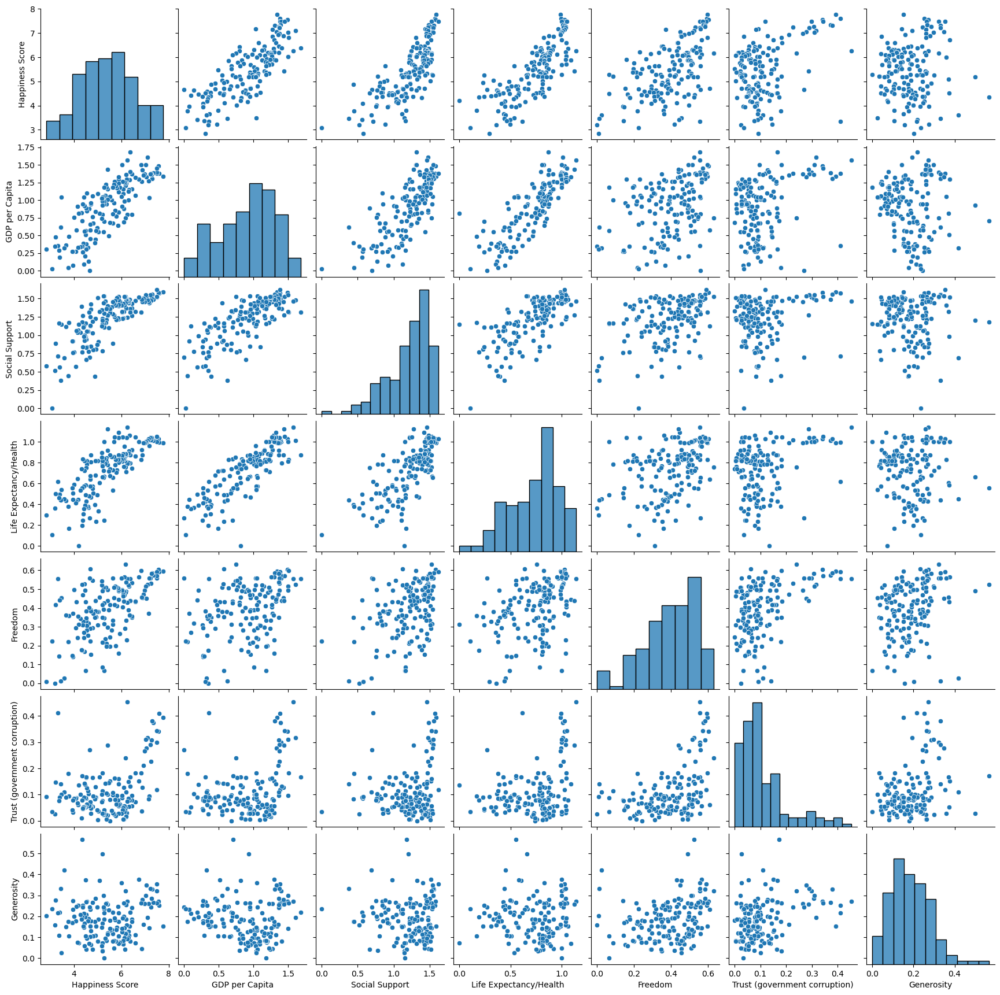

In [107]:
sns.pairplot(data2019)

<Axes: xlabel='Freedom', ylabel='Country'>

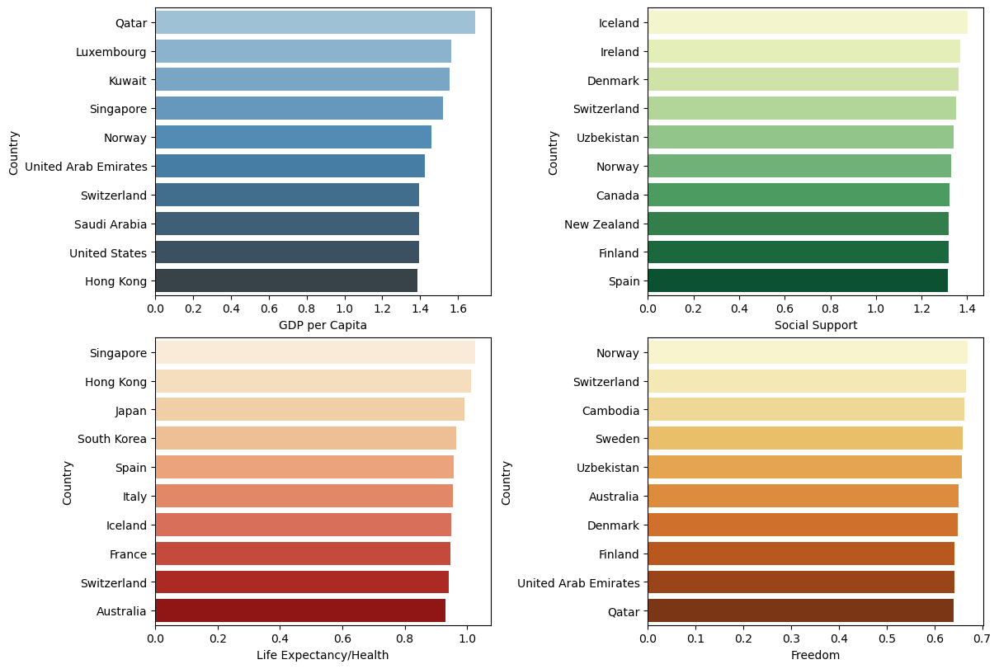

In [108]:
fig, axes = plt.subplots(nrows=2, ncols=2,constrained_layout=True,figsize=(12,8))
sns.barplot(x='GDP per Capita',y='Country',data=data2015.nlargest(10,'GDP per Capita'),ax=axes[0,0],palette="Blues_d")
sns.barplot(x='Social Support' ,y='Country',data=data2015.nlargest(10,'Social Support'),ax=axes[0,1],palette="YlGn")
sns.barplot(x='Life Expectancy/Health' ,y='Country',data=data2015.nlargest(10,'Life Expectancy/Health'),ax=axes[1,0],palette='OrRd')
sns.barplot(x='Freedom' ,y='Country',data=data2015.nlargest(10,'Freedom'),ax=axes[1,1],palette='YlOrBr')

<Axes: xlabel='Generosity', ylabel='Country'>

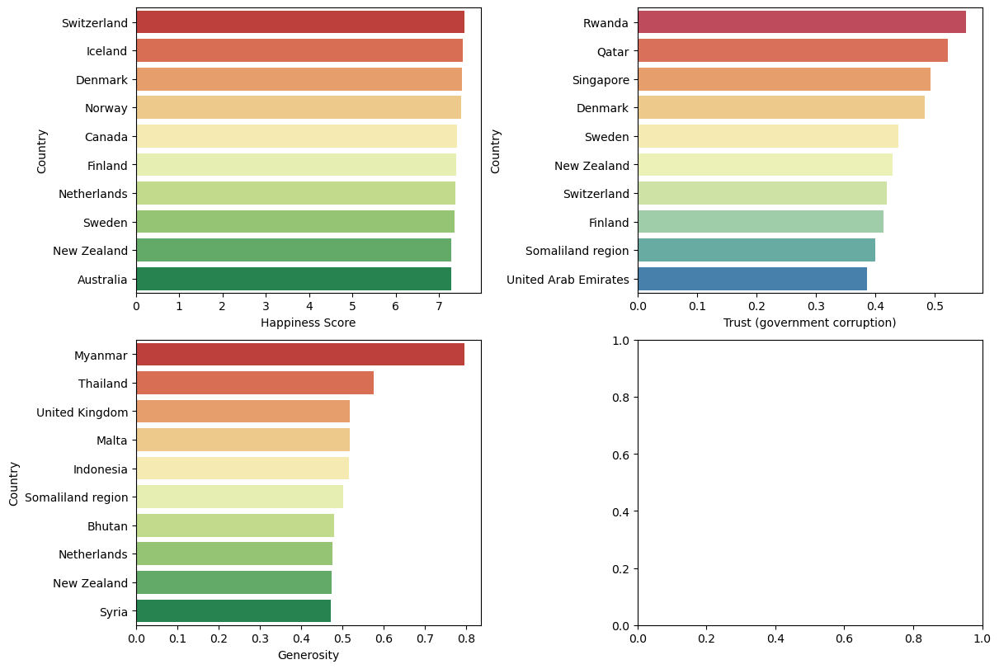

In [109]:

fig, axes = plt.subplots(nrows=2, ncols=2,constrained_layout=True,figsize=(12,8))
sns.barplot(x='Trust (government corruption)' ,y='Country',data=data2015.nlargest(10,'Trust (government corruption)'),ax=axes[0,1],palette="Spectral")
sns.barplot(x='Happiness Score' ,y='Country',data=data2015.nlargest(10,'Happiness Score'),ax=axes[0,0],palette="RdYlGn")
sns.barplot(x='Generosity' ,y='Country',data=data2015.nlargest(10,'Generosity'),ax=axes[1,0],palette="RdYlGn")

<Axes: xlabel='Freedom', ylabel='Country'>

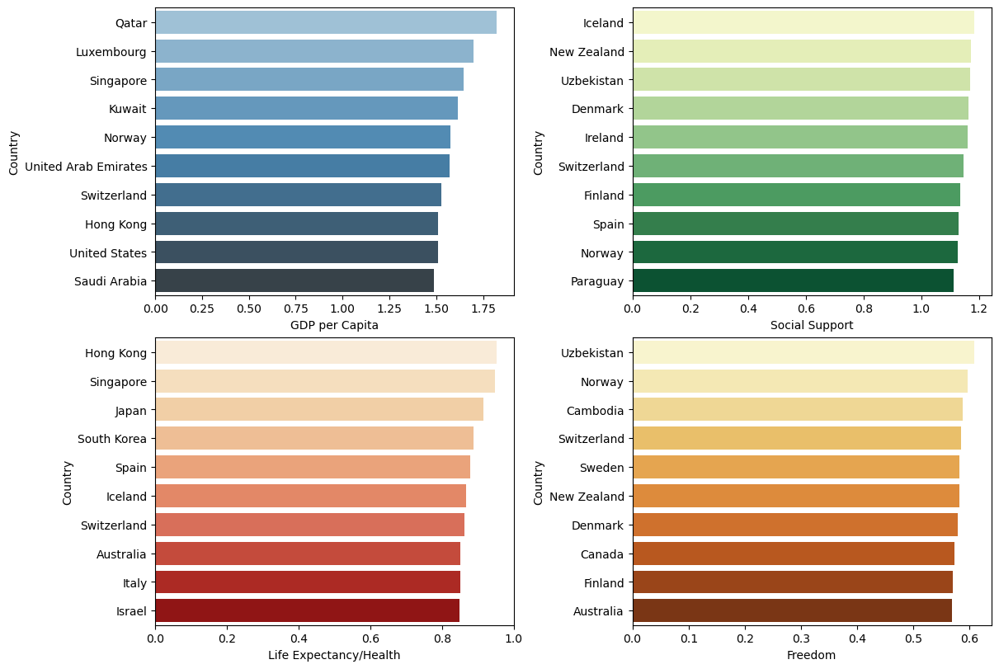

In [110]:
fig, axes = plt.subplots(nrows=2, ncols=2,constrained_layout=True,figsize=(12,8))
sns.barplot(x='GDP per Capita',y='Country',data=data2016.nlargest(10,'GDP per Capita'),ax=axes[0,0],palette="Blues_d")
sns.barplot(x='Social Support' ,y='Country',data=data2016.nlargest(10,'Social Support'),ax=axes[0,1],palette="YlGn")
sns.barplot(x='Life Expectancy/Health' ,y='Country',data=data2016.nlargest(10,'Life Expectancy/Health'),ax=axes[1,0],palette='OrRd')
sns.barplot(x='Freedom' ,y='Country',data=data2016.nlargest(10,'Freedom'),ax=axes[1,1],palette='YlOrBr')

<Axes: xlabel='Generosity', ylabel='Country'>

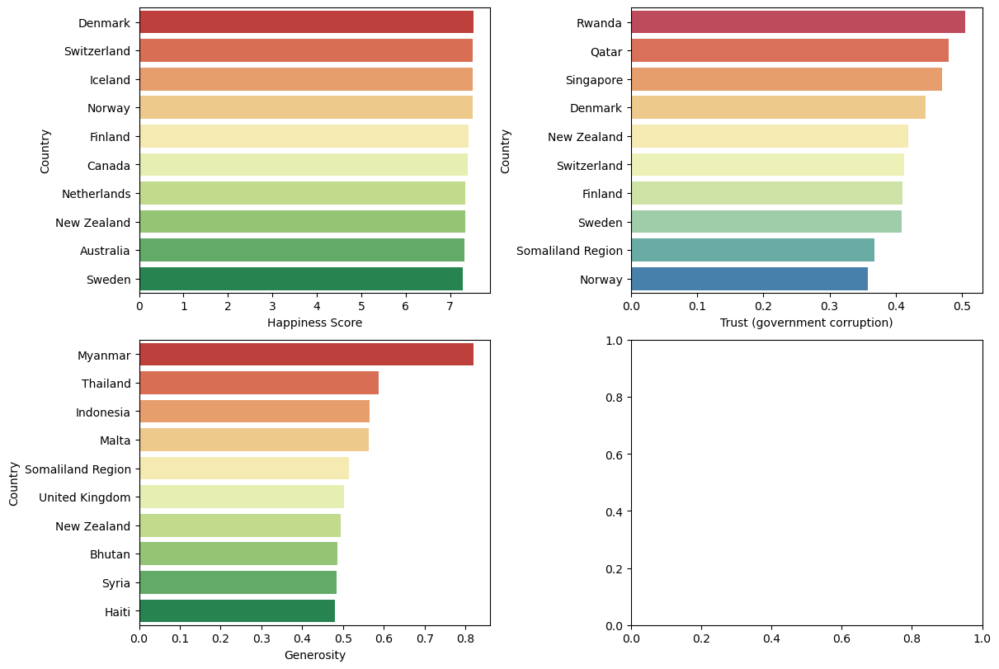

In [111]:

fig, axes = plt.subplots(nrows=2, ncols=2,constrained_layout=True,figsize=(12,8))
sns.barplot(x='Trust (government corruption)' ,y='Country',data=data2016.nlargest(10,'Trust (government corruption)'),ax=axes[0,1],palette="Spectral")
sns.barplot(x='Happiness Score' ,y='Country',data=data2016.nlargest(10,'Happiness Score'),ax=axes[0,0],palette="RdYlGn")
sns.barplot(x='Generosity' ,y='Country',data=data2016.nlargest(10,'Generosity'),ax=axes[1,0],palette="RdYlGn")

<Axes: xlabel='Freedom', ylabel='Country'>

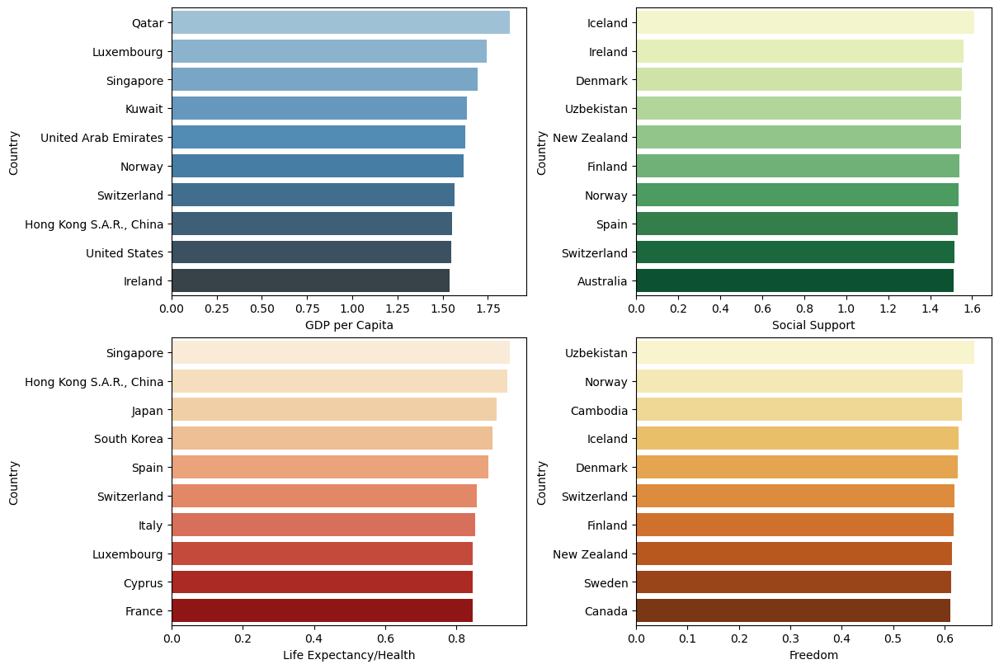

In [112]:
fig, axes = plt.subplots(nrows=2, ncols=2,constrained_layout=True,figsize=(12,8))
sns.barplot(x='GDP per Capita',y='Country',data=data2017.nlargest(10,'GDP per Capita'),ax=axes[0,0],palette="Blues_d")
sns.barplot(x='Social Support' ,y='Country',data=data2017.nlargest(10,'Social Support'),ax=axes[0,1],palette="YlGn")
sns.barplot(x='Life Expectancy/Health' ,y='Country',data=data2017.nlargest(10,'Life Expectancy/Health'),ax=axes[1,0],palette='OrRd')
sns.barplot(x='Freedom' ,y='Country',data=data2017.nlargest(10,'Freedom'),ax=axes[1,1],palette='YlOrBr')

<Axes: xlabel='Generosity', ylabel='Country'>

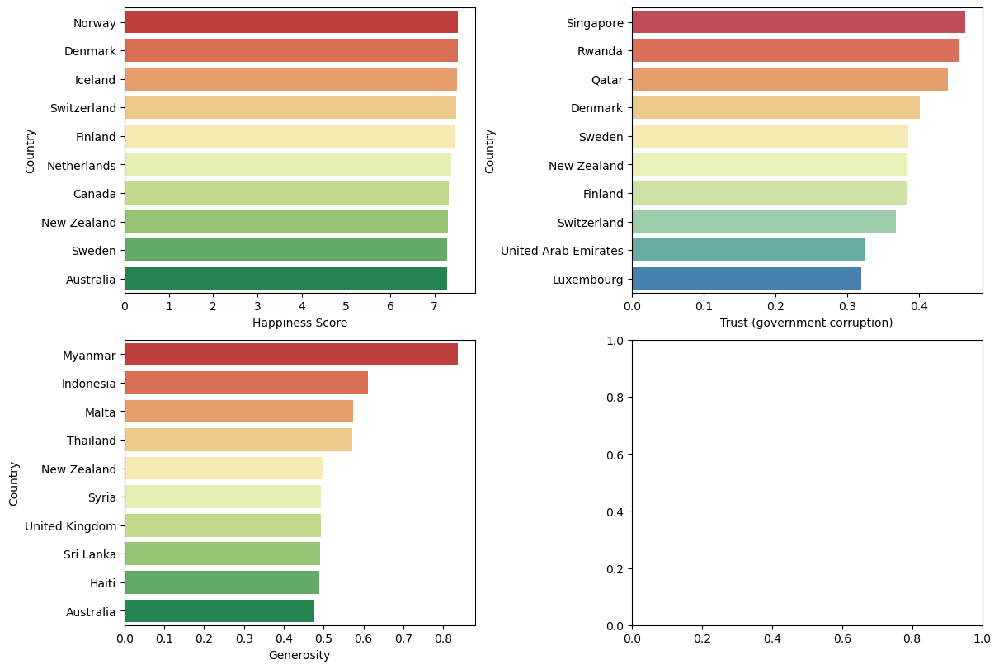

In [113]:

fig, axes = plt.subplots(nrows=2, ncols=2,constrained_layout=True,figsize=(12,8))
sns.barplot(x='Trust (government corruption)' ,y='Country',data=data2017.nlargest(10,'Trust (government corruption)'),ax=axes[0,1],palette="Spectral")
sns.barplot(x='Happiness Score' ,y='Country',data=data2017.nlargest(10,'Happiness Score'),ax=axes[0,0],palette="RdYlGn")
sns.barplot(x='Generosity' ,y='Country',data=data2017.nlargest(10,'Generosity'),ax=axes[1,0],palette="RdYlGn")

<Axes: xlabel='Freedom', ylabel='Country'>

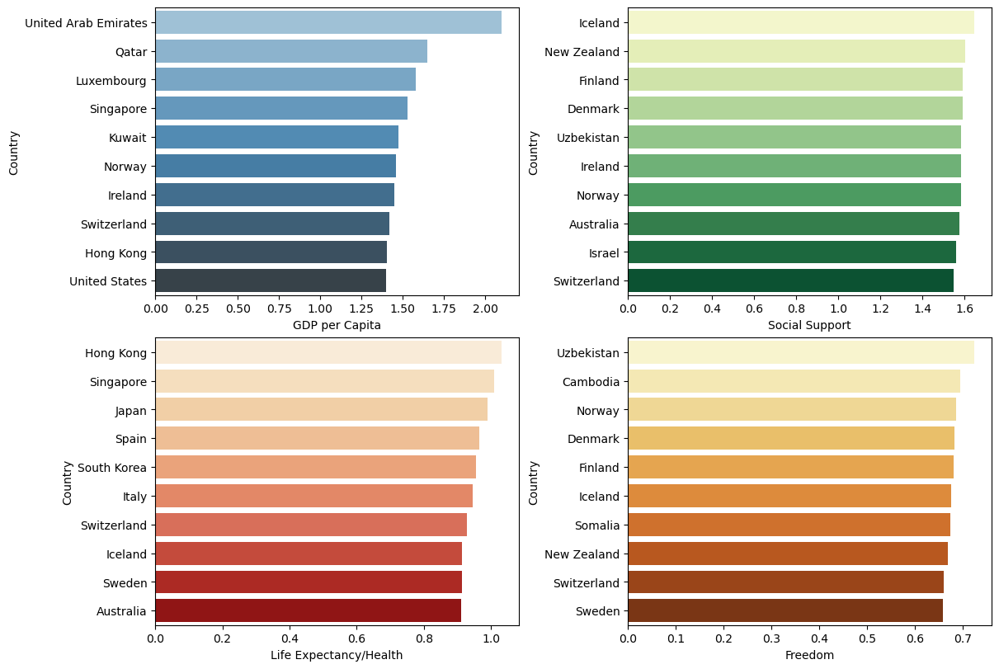

In [114]:
fig, axes = plt.subplots(nrows=2, ncols=2,constrained_layout=True,figsize=(12,8))
sns.barplot(x='GDP per Capita',y='Country',data=data2018.nlargest(10,'GDP per Capita'),ax=axes[0,0],palette="Blues_d")
sns.barplot(x='Social Support' ,y='Country',data=data2018.nlargest(10,'Social Support'),ax=axes[0,1],palette="YlGn")
sns.barplot(x='Life Expectancy/Health' ,y='Country',data=data2018.nlargest(10,'Life Expectancy/Health'),ax=axes[1,0],palette='OrRd')
sns.barplot(x='Freedom' ,y='Country',data=data2018.nlargest(10,'Freedom'),ax=axes[1,1],palette='YlOrBr')

<Axes: xlabel='Generosity', ylabel='Country'>

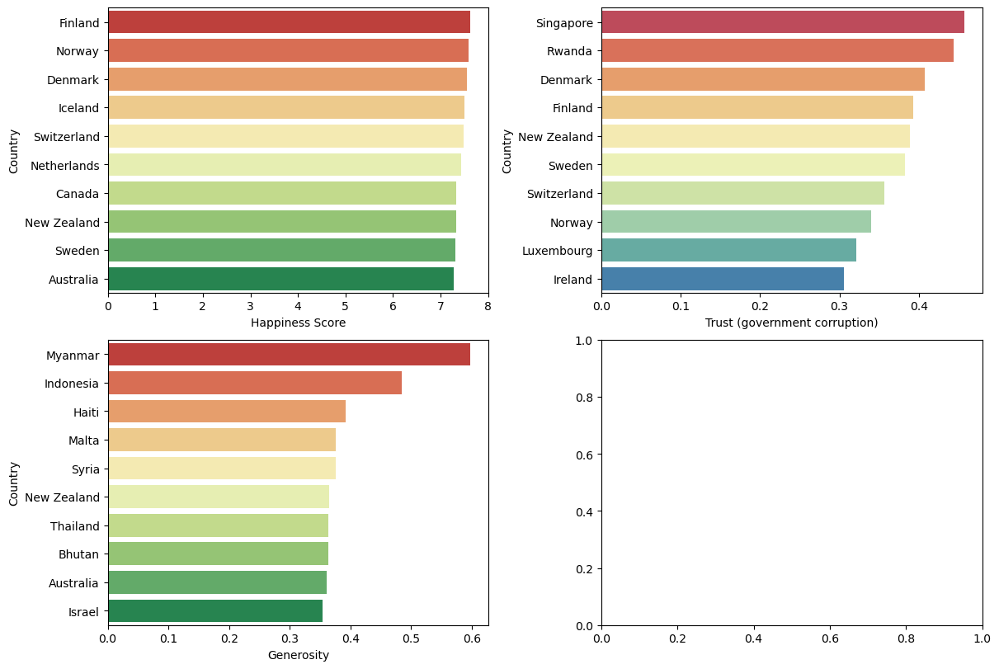

In [115]:

fig, axes = plt.subplots(nrows=2, ncols=2,constrained_layout=True,figsize=(12,8))
sns.barplot(x='Trust (government corruption)' ,y='Country',data=data2018.nlargest(10,'Trust (government corruption)'),ax=axes[0,1],palette="Spectral")
sns.barplot(x='Happiness Score' ,y='Country',data=data2018.nlargest(10,'Happiness Score'),ax=axes[0,0],palette="RdYlGn")
sns.barplot(x='Generosity' ,y='Country',data=data2018.nlargest(10,'Generosity'),ax=axes[1,0],palette="RdYlGn")

<Axes: xlabel='Freedom', ylabel='Country'>

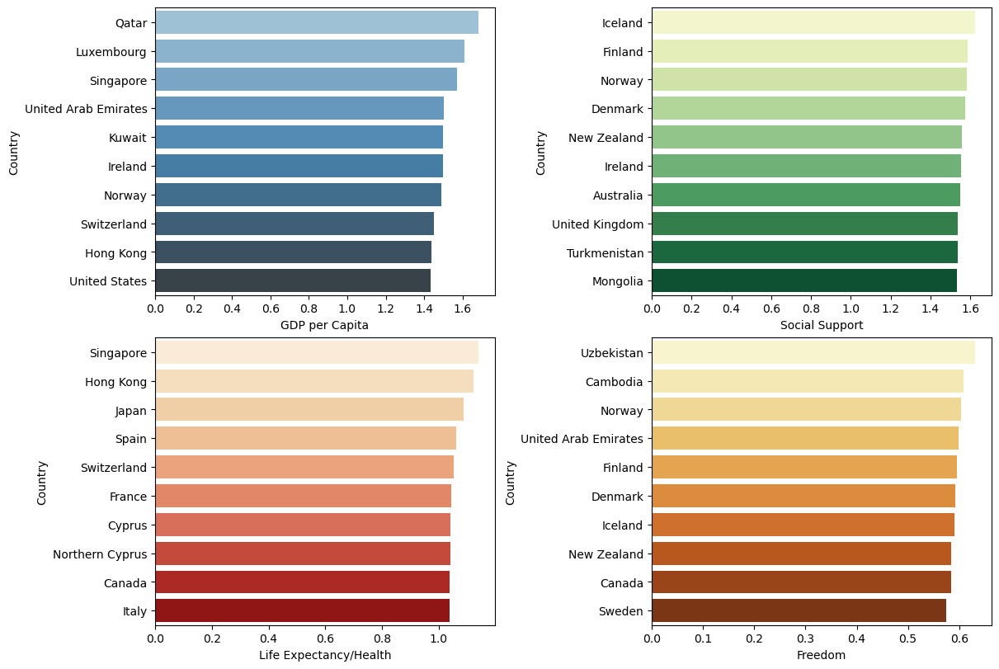

In [116]:
fig, axes = plt.subplots(nrows=2, ncols=2,constrained_layout=True,figsize=(12,8))
sns.barplot(x='GDP per Capita',y='Country',data=data2019.nlargest(10,'GDP per Capita'),ax=axes[0,0],palette="Blues_d")
sns.barplot(x='Social Support' ,y='Country',data=data2019.nlargest(10,'Social Support'),ax=axes[0,1],palette="YlGn")
sns.barplot(x='Life Expectancy/Health' ,y='Country',data=data2019.nlargest(10,'Life Expectancy/Health'),ax=axes[1,0],palette='OrRd')
sns.barplot(x='Freedom' ,y='Country',data=data2019.nlargest(10,'Freedom'),ax=axes[1,1],palette='YlOrBr')

<Axes: xlabel='Generosity', ylabel='Country'>

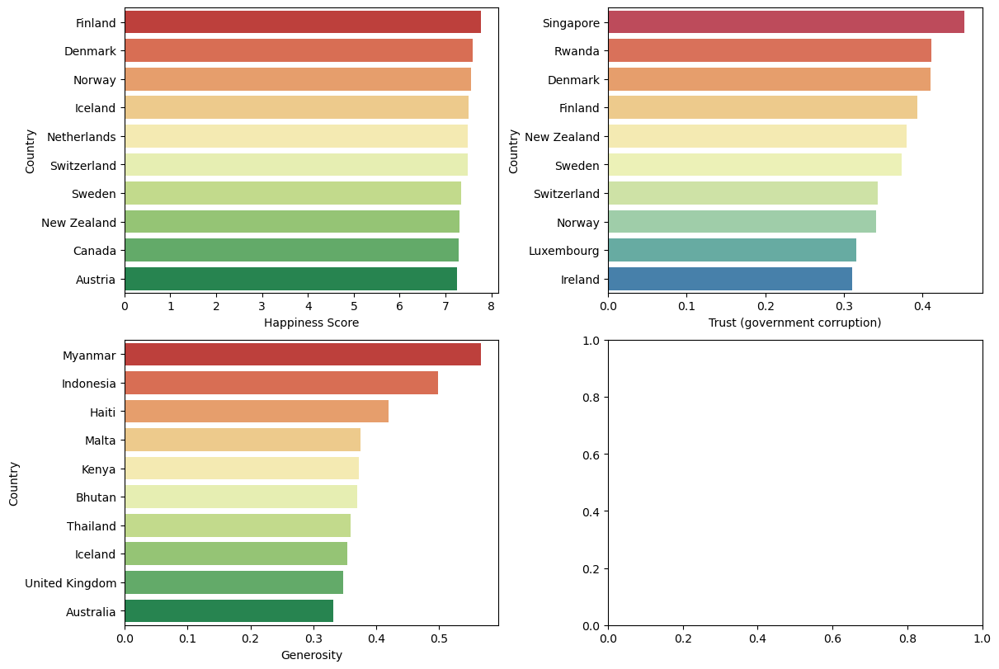

In [117]:

fig, axes = plt.subplots(nrows=2, ncols=2,constrained_layout=True,figsize=(12,8))
sns.barplot(x='Trust (government corruption)' ,y='Country',data=data2019.nlargest(10,'Trust (government corruption)'),ax=axes[0,1],palette="Spectral")
sns.barplot(x='Happiness Score' ,y='Country',data=data2019.nlargest(10,'Happiness Score'),ax=axes[0,0],palette="RdYlGn")
sns.barplot(x='Generosity' ,y='Country',data=data2019.nlargest(10,'Generosity'),ax=axes[1,0],palette="RdYlGn")

In [118]:
import plotly.graph_objs as go
from plotly.offline import iplot

data = dict(type = 'choropleth', 
           locations = data2015['Country'],
           locationmode = 'country names',
           colorscale='RdYlGn',
           z = data2015['Happiness Score'], 
           text = data2015['Country'],
           colorbar = {'title':'Happiness Score'})

layout = dict(title = 'Geographical Visualization of Happiness Score', 
              geo = dict(showframe = True, projection = {'type': 'azimuthal equal area'}))

choromap3 = go.Figure(data = [data], layout=layout)
iplot(choromap3)

In [119]:
#import plotly.graph_objs as go
#from plotly.offline import iplot

data = dict(type = 'choropleth', 
           locations = data2016['Country'],
           locationmode = 'country names',
           colorscale='RdYlGn',
           z = data2016['Happiness Score'], 
           text = data2016['Country'],
           colorbar = {'title':'Happiness Score'})

layout = dict(title = 'Geographical Visualization of Happiness Score', 
              geo = dict(showframe = True, projection = {'type': 'azimuthal equal area'}))

choromap3 = go.Figure(data = [data], layout=layout)
iplot(choromap3)

In [120]:
#import plotly.graph_objs as go
#from plotly.offline import iplot

data = dict(type = 'choropleth', 
           locations = data2017['Country'],
           locationmode = 'country names',
           colorscale='RdYlGn',
           z = data2017['Happiness Score'], 
           text = data2017['Country'],
           colorbar = {'title':'Happiness Score'})

layout = dict(title = 'Geographical Visualization of Happiness Score', 
              geo = dict(showframe = True, projection = {'type': 'azimuthal equal area'}))

choromap3 = go.Figure(data = [data], layout=layout)
iplot(choromap3)

In [121]:
#import plotly.graph_objs as go
#from plotly.offline import iplot

data = dict(type = 'choropleth', 
           locations = data2018['Country'],
           locationmode = 'country names',
           colorscale='RdYlGn',
           z = data2018['Happiness Score'], 
           text = data2018['Country'],
           colorbar = {'title':'Happiness Score'})

layout = dict(title = 'Geographical Visualization of Happiness Score', 
              geo = dict(showframe = True, projection = {'type': 'azimuthal equal area'}))

choromap3 = go.Figure(data = [data], layout=layout)
iplot(choromap3)

In [122]:
#import plotly.graph_objs as go
#from plotly.offline import iplot

data = dict(type = 'choropleth', 
           locations = data2019['Country'],
           locationmode = 'country names',
           colorscale='RdYlGn',
           z = data2019['Happiness Score'], 
           text = data2019['Country'],
           colorbar = {'title':'Happiness Score'})

layout = dict(title = 'Geographical Visualization of Happiness Score', 
              geo = dict(showframe = True, projection = {'type': 'azimuthal equal area'}))

choromap3 = go.Figure(data = [data], layout=layout)
iplot(choromap3)

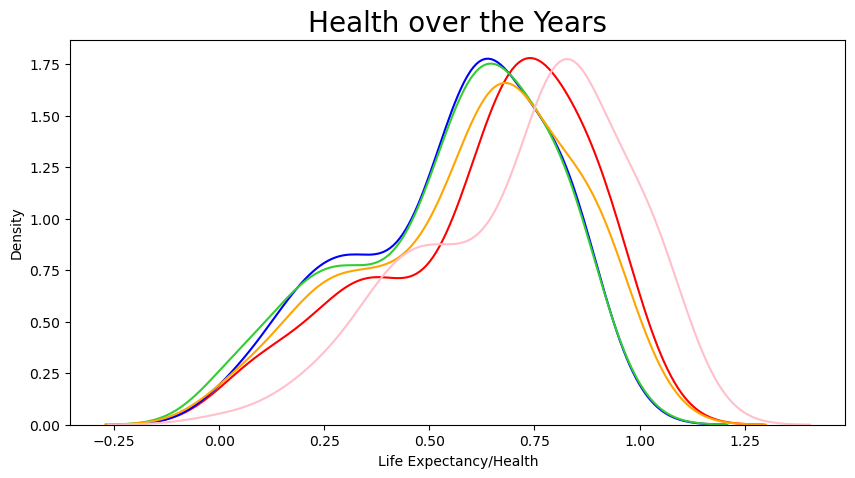

In [123]:
plt.figure(figsize=(10,5))
sns.kdeplot(data2015['Life Expectancy/Health'],color='red')
sns.kdeplot(data2016['Life Expectancy/Health'],color='blue')
sns.kdeplot(data2017['Life Expectancy/Health'],color='limegreen')
sns.kdeplot(data2018['Life Expectancy/Health'],color='orange')
sns.kdeplot(data2019['Life Expectancy/Health'],color='pink')
plt.title('Health over the Years',size=20)
plt.show()

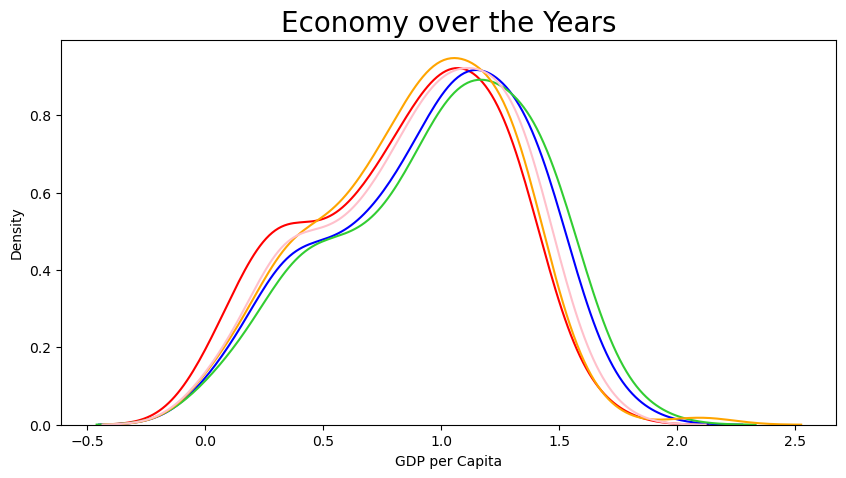

In [124]:
plt.figure(figsize=(10,5))
sns.kdeplot(data2015['GDP per Capita'],color='red')
sns.kdeplot(data2016['GDP per Capita'],color='blue')
sns.kdeplot(data2017['GDP per Capita'],color='limegreen')
sns.kdeplot(data2018['GDP per Capita'],color='orange')
sns.kdeplot(data2019['GDP per Capita'],color='pink')
plt.title('Economy over the Years',size=20)
plt.show()

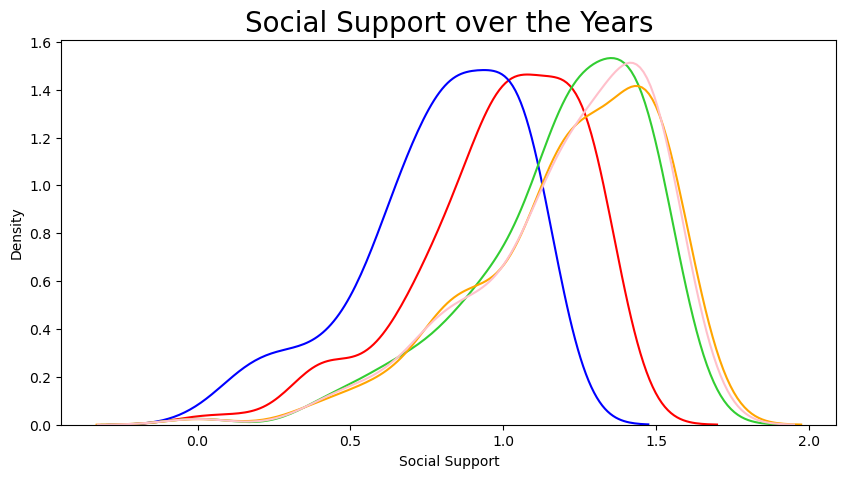

In [125]:
plt.figure(figsize=(10,5))
sns.kdeplot(data2015['Social Support'],color='red')
sns.kdeplot(data2016['Social Support'],color='blue')
sns.kdeplot(data2017['Social Support'],color='limegreen')
sns.kdeplot(data2018['Social Support'],color='orange')
sns.kdeplot(data2019['Social Support'],color='pink')
plt.title('Social Support over the Years',size=20)
plt.show()

In [ ]:



# city_list = combined_df['City'].tolist()

base_url = "https://api.geoapify.com/v1/geocode/search?"



In [130]:
for index,row in data2015.iterrows():
    
    countries = data2015.loc[index,"country"]
    countries_url = f"{base_url}country={country}&state=CO&apiKey={geoapify_key}"
    
    country_data = requests.get(countries_url).json()
    try:
        lat = countries_data['features'][0]['properties']['lat']
        lon = countries_data['features'][0]['properties']['lon']
        data2015.loc[index,"Latitude"] = lat
        data2015.loc[index,"Longitude"] = lon
        print(f"Coords for {country} stored in df")
    except:
        print(f'Error Occured with {country}')
        continue

KeyError: 'country'